In [1]:
# Training params
ratio = 0.9          # Train-Test split ratio
attempts = 20        # Number of times to run
width = 256
depth = 5
learning_rate = 5e-2
dropout = 0.0
regularization = 1e-8

# Ensemble analysis

In this notebook we analyse the models generated by the neural network. We therefore assume we now have access to the state assignment vectors $\mathbf{\chi}$, the equilibrium distributions $\mathbf{\pi}$, the Koopman matrices $\mathbf{K}$ and the indices to get back the original ordering. We first define the imports and useful utility functions.

In [2]:
from collections import defaultdict
import gc
from glob import glob
from multiprocessing import Pool
import itertools
import os
from pathlib import Path
import sys
from tempfile import TemporaryDirectory
from typing import List, Tuple, Sequence, Union
import warnings

import colorcet as cc
import holoviews as hv
from holoviews import opts, dim
import h5py
import matplotlib.pyplot as plt
from matplotlib import rc, ticker
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from msmtools.analysis import stationary_distribution, mfpt
from msmtools.flux import tpt
import mdtraj as md
import numpy as np
import numba as nb
import pyemma as pe
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem.Draw import SimilarityMaps, rdMolDraw2D, IPythonConsole
from scipy.linalg import eig
from scipy.stats import gaussian_kde
import seaborn as sns

# Plot settings
sns.set_palette("husl", 8)
rc("font", **{"family": "Helvetica",
              "sans-serif": ["Helvetica"]})
rc("svg", **{"fonttype": "none"})
colors = sns.color_palette("husl", 8)
hv.extension("matplotlib")
IPythonConsole.drawOptions.useBWAtomPalette()

warnings.filterwarnings('ignore')

colormap = dict(
    apo=colors[3],
    holo=colors[5],
    control=colors[6]
)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

## Utility functions

`data.py` contains all the class definitions we need to handle the neural network output without having to deal with `keras`. We also define various other useful functions.

In [3]:
%run data.py

In [4]:
def unflatten(source: np.ndarray, lengths: List[int]) -> List[np.ndarray]:
    """
    Takes an array and returns a list of arrays.
    
    Parameters
    ----------
    source
        Array to be unflattened.
    lengths
        List of integers giving the length of each subarray.
        Must sum to the length of source.
    
    Returns
    -------
    unflat
        List of arrays.
    
    """
    conv = []
    lp = 0
    for arr in lengths:
        arrconv = []
        for le in arr:
            arrconv.append(source[lp:le + lp])
            lp += le
        conv.append(arrconv)
    ccs = list(itertools.chain(*conv))
    return ccs

In [5]:
def sort_lengths(flatlengths: Sequence[int], shapes: Sequence[int]) -> List[List[int]]:
    """
    Takes a list of lengths and returns a list of lists of lengths.
    
    Parameters
    ----------
    flatlengths
        List of lengths
    shapes
        List of shapes
    
    Returns
    -------
    lengths
        List of lists of lengths
    
    """
    lengths = []
    i = 0
    for n in shapes:
        arr = []
        for _ in range(n):
            arr.append(flatlengths[i])
            i += 1
        lengths.append(arr)
    return lengths

In [6]:
def triu_inverse(x: np.ndarray, n: int, offset: int=0) -> np.ndarray:
    """
    Converts flattened upper-triangular matrices into full symmetric matrices.
    
    Parameters
    ----------
    x
        Flattened matrices
    n
        Size of the n * n matrix
    
    Returns
    -------
    mat
        Array of shape (length, n, n)
    
    """
    length = x.shape[0]
    mat = np.zeros((length, n, n))
    a, b = np.triu_indices(n, k=offset)
    mat[:, a, b] = x
    mat += mat.swapaxes(1, 2)
    return mat

In [7]:
def statdist(X: np.ndarray) -> np.ndarray:
    """
    Calculate the equilibrium distribution of a transition matrix.
    
    Parameters
    ----------
    X
        Row-stochastic transition matrix
    
    Returns
    -------
    mu
        Stationary distribution, i.e. the left
        eigenvector associated with eigenvalue 1.
    
    """
    ev, evec = eig(X, left=True, right=False)
    mu = evec.T[ev.argmax()]
    mu /= mu.sum()
    return mu

In [8]:
def unique_sorting(rmsd: np.ndarray) -> np.ndarray:
    """
    Sorts a matrix of RMSD values.
    
    Parameters
    ----------
    rmsd
        Array of shape (n, n) with interstate differences.
        This matrix should be acquired by calculating the RMSD
        between a reference decomposition and a trial decomposition.
    
    Returns
    -------
    sorter
        Array of sorted indices
    
    """
    size = rmsd.shape[0]
    
    # -1 is not yet assigned
    sorter = np.full(size, -1, dtype=np.int8)
    sorted_idx = rmsd.argsort(axis=None)
    
    # We walk through the sorted RMSDs from low to high and assign the 2D indices.
    # If one is already assigned, we just jump to the next one, which will be the next-lowest RMSD.
    for i, j in zip(*np.unravel_index(sorted_idx, (size, size))):
        if sorter[i] < 0 and j not in sorter:
            sorter[i] = j
    return sorter

In [9]:
def idx_to_traj(idx: int, lengths: List[int]) -> Tuple[int, int]:
    """
    Given a trajectory index, find the round and trajectory file number.
    
    Parameters
    ----------
    idx
        Trajectory index
    lengths
        Length of each round
    
    Returns
    -------
    round, number
        Simulation round and corresponding trajectory number
    
    """
    lengths = np.array(lengths)
    lcs = lengths.cumsum()
    if idx >= lengths[0]:
        nr = idx - lcs[lcs < idx][-1]
        i = np.arange(len(lengths))[lcs > idx][0]
    else:
        i, nr = 0, idx
    return i, nr

In [10]:
# msmtools doesn't think our matrices are normalized enough,
# so we normalize until we hit the default tolerance requirement.
# @nb.njit()
def renormalize(mat, tol=1e-12, axis=1, max_iter=1e6):
    mat = np.ascontiguousarray(mat)
    n = mat.shape[0]
    calls = 0
    while np.abs(np.ones(n) - mat.sum(axis=axis)).max() > tol or calls < max_iter:
        calls += 1
        mat = np.abs(mat) / np.abs(mat).sum(axis=axis)
    return mat

In [11]:
def plot_its(its, lags, dt=1.0):
    multi = its.ndim == 3
    nits, nlags = its.shape[-2], its.shape[-1]
    fig = plt.figure(figsize=(4, 4))
    ax = fig.add_subplot(111)
    
    if multi:
        itsm = its.mean(axis=0)
        cfl, cfu = np.percentile(its, q=(2.5, 97.5), axis=0)
    else:
        itsm = its
    
    ax.semilogy(lags * dt, lags * dt, color="k")
    ax.fill_between(lags * dt, ax.get_ylim()[0] * np.ones(len(lags)),
                    lags * dt, color="k", alpha=0.2)
    for i in range(nits):
        ax.plot(lags * dt, itsm[i], marker="o",
                    linestyle="dashed", linewidth=1.5, color=colors[-(i + 2)])
        ax.plot(lags * dt, itsm[i], marker="o", linewidth=1.5, color=colors[-(i + 2)])
        if multi:
            ax.fill_between(lags * dt, cfl[i], cfu[i],
                            interpolate=True, color=colors[-(i + 2)], alpha=0.2)
    loc = ticker.LogLocator(base=10.0, subs=(0.2, 0.4, 0.6, 0.8), numticks=12)
    ax.set_ylim(0, 50000)
    ax.set_yticks(10 ** np.arange(6))
    ax.yaxis.set_minor_locator(loc)
    ax.yaxis.set_minor_formatter(ticker.NullFormatter())
    ax.set_xlabel(r"$\tau$ [ns]", fontsize=24)
    ax.set_ylabel(r"$t_i$ [ns]", fontsize=24)
    ax.tick_params(labelsize=24)
    sns.despine(ax=ax)
    return fig

In [12]:
def plot_ck(cke, ckp, lag, ranges=0.2):
    multi = cke.ndim == 4
    n = cke.shape[-2]
    steps = cke.shape[-1]
    
    if multi:
        ckem = cke.mean(axis=0)
        ckpm = ckp.mean(axis=0)
        ckep = np.percentile(cke, q=(2.5, 97.5), axis=0)
        ckpp = np.percentile(ckp, q=(2.5, 97.5), axis=0)
    else:
        ckem = cke
        ckpm = ckp
    
    fig, axes = plt.subplots(n, n, figsize=(4 * n, 4 * n), sharex=True)
    for i in range(n):
        for j in range(n):
            ax = axes[i, j]
            x = np.arange(0, steps * lag, lag)
            if multi:
                ax.errorbar(x, ckpm[i, j], yerr=[ckpm[i, j] - ckpp[0, i, j], ckpp[1, i, j] - ckpm[i, j]],
                            linewidth=2, elinewidth=2)
                ax.fill_between(x, ckep[0, i, j], ckep[1, i, j],
                                alpha=0.2, interpolate=True, color=colors[1])
            else:
                ax.plot(x, ckpm[i, j], linestyle="-", color=colors[0], linewidth=2)
            ax.plot(x, ckem[i, j], linestyle="--", color=colors[1], linewidth=2)
            
            if i == j:
                ax.set_ylim(1 - ranges - 0.02, 1.02)
                ax.text(0, 1 - ranges, r"{0} $\to$ {1}".format(i, j), fontsize=24, verticalalignment="center")
            else:
                ax.set_ylim(-0.02, ranges + 0.02)
                ax.text(0, 0.2, r"{0} $\to$ {1}".format(i, j), fontsize=24, verticalalignment="center")
            ax.set_xticks(np.arange(0, steps * lag, lag), minor=True)
            ax.set_xticks(np.arange(0, steps * lag, 2 * lag))
            ax.set_xticklabels((np.arange(0, steps * lag, 2 * lag) * dt).astype(int))
            ax.tick_params(labelsize=24)
    fig.text(0.5, 0.01 * 1.5 * n, r"$\tau$ [ns]", ha="center", fontsize=24)
    fig.text(0.01 * 1.5 * n, 0.5, r"$P$", va="center", rotation="vertical", fontsize=24)
    fig.subplots_adjust(wspace=0.25)
    return fig

In [13]:
def estimate_koopman(data: List[np.ndarray], lag: int) -> np.ndarray:
    """
    Estimate the Koopman matrix.
    
    Parameters
    ----------
    data
        List of state vector trajectories
    lag
        Lag time for estimating the matrix
    
    Returns
    -------
    K
        The Koopman matrix
    
    """
    cl = pe.coordinates.covariance_lagged(
            data=data, lag=lag, weights="empirical",
            reversible=True, bessel=True)
    return np.linalg.pinv(cl.C00_) @ cl.C0t_

In [14]:
def h5tree(file: Union[Path, str], depth: int=-1):
    """
    Show the contents of an HDF5 file as a tree.
    
    Parameters
    ----------
    file
        Path to the HDF5 file
    depth
        Maximum depth to show (-1 for unlimited)
    
    """
    def _recurse(obj: Union[h5py.Group, h5py.Dataset], counter=0):
        # Stop recursing when hitting the maximum depth or a dataset
        if not isinstance(obj, h5py.Group) or counter == depth:
            return
        
        for k, o in obj.items():
            print(f"{'  ' * counter} - {k}")
            _recurse(o, counter + 1)
    
    with h5py.File(file, "r") as read:
        _recurse(read)

## Data
### Trajectories
Trajectories were acquired in multiple rounds of 1024 simulations each at 278 K in the $NVT$ ensemble yielding approximately 300 µs per ensemble. Postprocessing involved removing water, subsampling to 250 ps timesteps, and making molecules whole.

In [15]:
sim_names = ("apo", "holo", "control")
mol_sim_names = ("holo", "control")
top, trajs = {}, {}
trajs = {k: sorted(glob("trajectories/{0}/r?/traj*.xtc".format(k))) for k in sim_names}
top = {k: "trajectories/{0}/topol.gro".format(k) for k in sim_names}
KBT = 2.311420 # 278 K
nres = 42
traj_rounds = {
    "apo": [1024, 1023, 1024, 1024, 1024],
    "holo": [1023, 1024, 32],
    "control": [1024, 1023]
}

# This is only really necessary for the residues in the plots
topo = md.load_topology(top["apo"])

We use minimum distances as features for the neural network:

In [16]:
allpairs = np.asarray(list(itertools.combinations(range(nres), 2)))
inpcon = {}
for k in sim_names:
    feat = pe.coordinates.featurizer(top[k])
    feat.add_residue_mindist(residue_pairs=allpairs)
    inpcon[k] = pe.coordinates.source(trajs[k], feat)

In [17]:
lengths, nframes = {}, {}
for k in sim_names:
    lengths[k] = sort_lengths(inpcon[k].trajectory_lengths(), traj_rounds[k])
    nframes[k] = inpcon[k].trajectory_lengths().sum()

In [18]:
print("\t\t" + "\t\t".join(sim_names))
print("\n".join((
    "Trajs: \t\t" + "\t\t".join("{0}".format(len(trajs[k])) for k in sim_names),
    "Frames: \t" + "\t\t".join("{0}".format(nframes[k]) for k in sim_names),
    "Time: \t\t" + "\t".join("{0:5.3f} µs".format(inpcon[k].trajectory_lengths().sum() * 0.00025)
                           for k in sim_names)
)))

		apo		holo		control
Trajs: 		5119		2079		2047
Frames: 	1259172		1225868		1114503
Time: 		314.793 µs	306.467 µs	278.626 µs


### Experimental
Chemical shifts were acquired at 278 K. We have C$\alpha$, C$\beta$, C', H$\alpha$, HN, and N shifts available. The chemical shifts were backcalculated from the trajectory using Camshift [2], the errors are given by the test-set errors.

[2]	Kohlhoff, K. J., Robustelli, P., Cavalli, A., Salvatella, X. & Vendruscolo, M. Fast and accurate predictions of protein NMR chemical shifts from interatomic distances. J. Am. Chem. Soc. 131, 13894–13895 (2009).

In [19]:
csraw = {k: sorted(glob("trajectories/{0}/r?cs/cs*.dat".format(k))) for k in sim_names}
cs = {k: [np.loadtxt(f)[:, 1:207] for f in csraw[k]] for k in ("apo", "control", "holo")}
csexp = np.loadtxt(csraw["apo"][0])[0, 207:]

err = {"NH": 3.01, "HN": 0.56, "HA": 0.28, "CA": 1.3, "CB": 1.36, "CO": 1.38}
nerr = {"CA": 37, "CB": 27, "CO": 37, "HA": 31, "HN": 37, "NH": 37}
experr = np.array([err["CA"]] * 37 + [err["CB"]] * 27 + [err["CO"]] * 37 +
                  [err["HA"]] * 31 + [err["HN"]] * 37 + [err["NH"]] * 37)

## VAMPNet
VAMPNet[1] is composed of two lobes, one reading the system features $\mathbf{x}$ at a timepoint $t$ and the other after some lag time $\tau$. In this case the network reads all minimum inter-residue distances (780 values) and sends them through 8 layers with 2048 nodes each. The final layer uses between 2 and 8 *softmax* outputs to yield a state assignment vector $\chi: \mathbb{R}^n \to \mathcal{S}$ where $\mathcal{S} = \{ s \in \mathbb{R}^n \mid 0 \le s_i \le 1, \sum_i^n s_i = 1 \}$ representing the probability of a state assignment. One lobe thus transforms a system state into a state occupation probability. We can also view this value as a kind of reverse ambiguity, i.e. how sure the network is that the system is part of a certain cluster. These outputs are then used as the input for the VAMP scoring function. It is based on the idea that any approximation of the true Koopman operator will provide an underestimate of it's eigenvalues. We can therefore maximize with regards to our function, and thus find an ideal state decomposition.

[1] Mardt, A., Pasquali, L., Wu, H. & Noé, F. VAMPnets for deep learning of molecular kinetics. Nat Comms 1–11 (2017). doi:10.1038/s41467-017-02388-1

### Data preparation
We use minimum residue distances as input ($\frac{N(N-1)}{2}$ values, where $N$ is the number of residues) for the neural network, but remove the 2nd and 3rd off-diagonals:

In [19]:
for k in sim_names:
    filename = "intermediate/mindist-all-{0}.npy".format(k)
    if not os.path.exists(filename):
        print("No mindist file for {0} ensemble, calculating from scratch...".format(k))
        con = np.vstack(inpcon[k].get_output())
        np.save(filename, con)

In [20]:
idx = np.triu_indices(nres, k=1)
mat = np.zeros((nres, nres), dtype=np.int)
input_flat, input_data = {}, {}
for k in sim_names:
    raw = np.load("intermediate/mindist-all-{0}.npy".format(k))
    mat[idx] = np.arange(raw.shape[1])
    redinds = mat[np.triu_indices_from(mat, k=3)]
    input_flat[k] = ((raw - raw.mean(axis=0)) / raw.std(axis=0))[:, redinds]
    input_data[k] = unflatten(input_flat[k], lengths[k])

We also use the full minimum inter-residue distances for some analysis:

In [21]:
mindist, mindist_flat = {}, {}
for k in sim_names:
    raw = np.load("intermediate/mindist-all-{0}.npy".format(k))
    mindist_flat[k] = raw
    mindist[k] = unflatten(mindist_flat[k], lengths[k])

### Neural network hyperparameters
To allow for a larger hyperparameter search space, we use the self-normalizing neural network approach by Klambauer *et al.* [2], thus using SELU units, `AlphaDropout` and normalized `LeCun` weight initialization. The other hyperparameters are defined at the beginning of this notebook.

[2] Klambauer, G., Unterthiner, T., Mayr, A. & Hochreiter, S. Self-Normalizing Neural Networks. arXiv.org cs.LG, (2017).

In [22]:
activation = "selu"                 # NN activation function
init = "lecun_normal"               # NN weight initialization
lag = 20                            # Lag time
n_epoch = 100                       # Max. number of epochs
n_epoch_s = 10000                   # Max. number of epochs for S optimization
n_batch = 5000                      # Training batch size
n_dims = input_data[k][0].shape[1]  # Input dimension
nres = 42                           # Number of residues
epsilon = 1e-7                      # Floating point noise
dt = 0.25                           # Trajectory timestep in ns
steps = 6                           # CK test steps

# Number of frames in the bootstrap sample
bs_frames = {
    "apo": 900000,
    "holo": 721782,
    "control": 900000
}

outsizes = np.array([2, 3, 4, 5])
lags = np.array([1, 2, 5, 10, 20, 50, 100])

# Analysis

## Model validation
We load the previously trained neural network models and calculate the implied timescales, Chapman-Kolmogorov test, and the Koopman operators. This can take a long time, as the constraint vectors have to be re-estimated for every lag time, so we save the intermediate results.

### State sorting
As every run of the neural network will generate a different ordering of (mostly the same) classes, we need to reorder them to be internally consistent. We do this by calculating the root-mean-square deviation between all average inter-residue minimum distance matrices for the individual states and matching the lowest values. We also make sure the sorting is unique, i.e. all states are accounted for, even if a certain RMSD is lower.

In [26]:
# Only needs to be run once!
with h5py.File("intermediate/data.hdf5") as store:
    for k in ("holo", "control"):
        sim = store[k]
        for n in outsizes:
            # First attempt is the reference dataset
            ref_group = sim["{0}/{1}".format(0, n)]
            ref = ref_group["full"][:, :n]
            valid = np.isfinite(ref).all(axis=1)
            bssize = ref_group["bootstrap"][:, :n].shape[0]

            # This is the average contact map for every
            # state for the first training attempt
            conwref = (ref[valid] / ref[valid].sum(axis=0)).T @ mindist_flat[k][valid]
            conwrefbt = np.broadcast_to(conwref, (n, n, mindist_flat[k].shape[1])).swapaxes(0, 1)
            sd = ref_group.require_dataset("sorter", shape=(n,), dtype="int32")
            fsd = ref_group.require_dataset(
                "full_sorted", shape=(mindist_flat[k].shape[0], n), dtype="float32")
            bsd = ref_group.require_dataset(
                "bootstrap_sorted", shape=(bssize, n), dtype="float32")
            sd[:], fsd[:], bsd[:] = np.arange(n), ref, ref_group["bootstrap"][:, :n]

            for i in range(1, attempts):
                print(f"Processing k={k} n={n} i={i}...", end="\r")
                group = sim["{0}/{1}".format(i, n)]
                pf = group["full"][:, :n]
                valid = np.isfinite(pf).all(axis=1)

                # Average contact map for each state for attempt `i`
                conw = (pf[valid] / pf[valid].sum(axis=0)).T @ mindist_flat[k][valid]
                conwbt = np.broadcast_to(conw, (n, n, mindist_flat[k].shape[1]))

                # Calculate the RMSD to our reference attempt
                rmsd = np.sqrt(((conwbt - conwrefbt) ** 2).sum(axis=-1))

                # Get a permutation vector and store it
                sorter = unique_sorting(rmsd)
                sd = group.require_dataset("sorter", shape=(n,), dtype="int32")
                fsd = group.require_dataset("full_sorted", shape=(mindist_flat[k].shape[0], n), dtype="float32")
                bsd = group.require_dataset("bootstrap_sorted", shape=(bssize, n), dtype="float32")
                sd[:], fsd[:], bsd[:] = sorter, pf[:, sorter], group["bootstrap"][:, :n][:, sorter]

In [24]:
pfs, pfsn, koops, pis, sorters = {}, {}, {}, {}, {}
with h5py.File("intermediate/data.hdf5") as store:
    for k in sim_names:
        pfs[k] = {n: np.empty((attempts, nframes[k], n)) for n in outsizes}
        koops[k] = {n: np.empty((attempts, n, n)) for n in outsizes}
        pis[k] = {n: np.empty((attempts, n)) for n in outsizes}
        sorters[k] = {n: np.empty((attempts, n), dtype=int) for n in outsizes}
        for i in range(attempts):
            for n in outsizes:
                print(f"{k}/{i}/{n}", end="\r")
                sorters[k][n][i] = (store[f"{k}/{i}/{n}/sorter"][:]).astype(int)
                pfs[k][n][i] = store[f"{k}/{i}/{n}/full_sorted".format(i, n)][:]
                koops[k][n][i] = store[f"{k}/{i}/{n}/k".format(i, n)][:][sorters[k][n][i]][:, sorters[k][n][i]]
                pis[k][n][i] = statdist(koops[k][n][i])

We calculate an equilibrium weighting vector, analogous to discrete Markov models:

\begin{equation}
w_t = \frac{\langle \chi(\mathbf{x}_t) | \mathbf{\pi} \rangle}{\sum_t^N \langle \chi(\mathbf{x}_t) | \mathbf{\pi} \rangle}
\end{equation}

In [25]:
weights = {}
for k in sim_names:
    weights[k] = {}
    for n in outsizes:
        weights[k][n] = np.empty((attempts, nframes[k]))
        for i in range(attempts):
            w = pfs[k][n][i] @ pis[k][n][i]
            weights[k][n][i] = w / np.nansum(w)

#### Global sorting
Because state assignments will not only be different within a choice of number of states, but also globally, we sort the states based on their population.

In [26]:
global_sorter = {k: {n: pis[k][n].mean(axis=0).argsort()[::-1] for n in outsizes}
                 for k in sim_names}

### Experimental backcalculation
We calculate the root-mean-square deviation of backcalculated values (using CamShift) to experimental observables for all ensembles:

In [27]:
labels = {
    "CA": ((0, 37), (30, 70)),
    "CB": ((37, 64), (10, 70)),
    "CO": ((64, 101), (165, 185)),
    "HA": ((101, 132), (0, 6)),
    "HN": ((132, 169), (0, 12)),
    "NH": ((169, 206), (90, 140))
}

In [28]:
n = 2
n_cs = cs[k][0].shape[1]
rmsd, rmsderr = {}, {}
for k in ("apo", "control", "holo"):
    cs_stack = np.vstack(cs[k])
    inds = unflatten(np.arange(nframes[k]).reshape(-1, 1), lengths[k])
    csm = np.empty((attempts, n_cs))
    for i in range(attempts):
        generator = DataGenerator.from_state(inds, "models/model-idx-{0}-{1}.hdf5".format(k, i))
        idx = generator(n=n, lag=20).trains[0].flatten().astype(int)
        print("Processing k={0} i={1}...".format(k, i), end="\r")
        w = weights[k][n][i, idx]
        valid = np.isfinite(w)
        csm[i] = np.einsum("i,ij->j", w[valid] / w[valid].sum(), cs_stack[idx][valid])
    sqdev = (csm - csexp) ** 2
    rmsd[k] = {tk: np.sqrt(sqdev[:, v[0][0]:v[0][1]].mean(axis=1)) for tk, v in labels.items()}
    rmsderr[k] = [
        (tk, rmsd[k][tk].mean(axis=0),
         np.percentile(rmsd[k][tk], (2.5, 97.5)))
        for tk in sorted(labels.keys())]

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


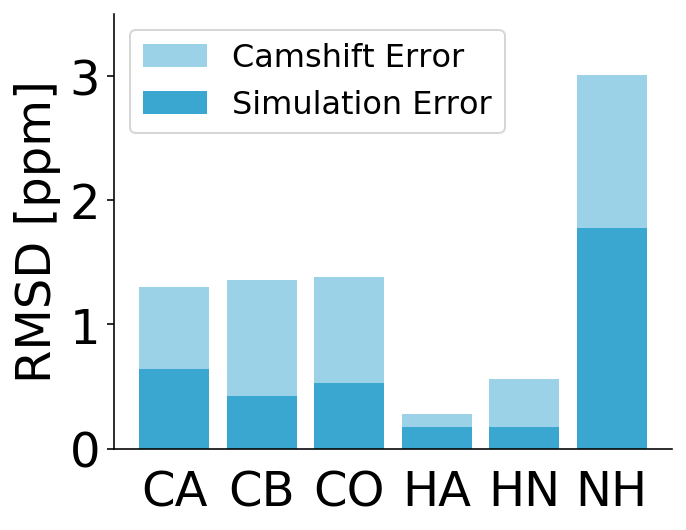

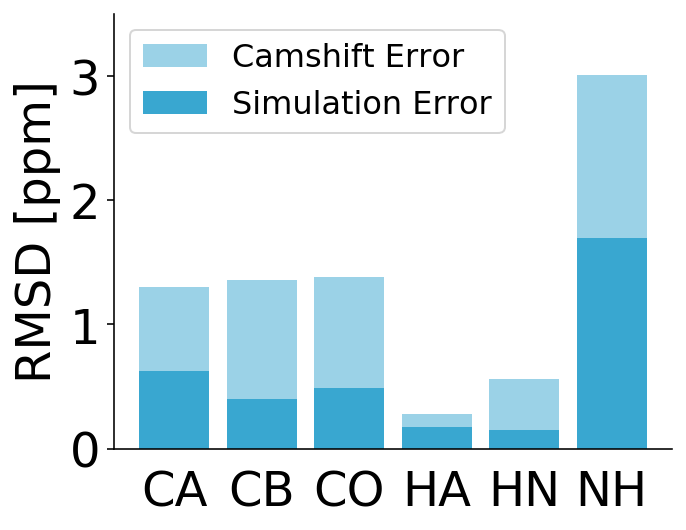

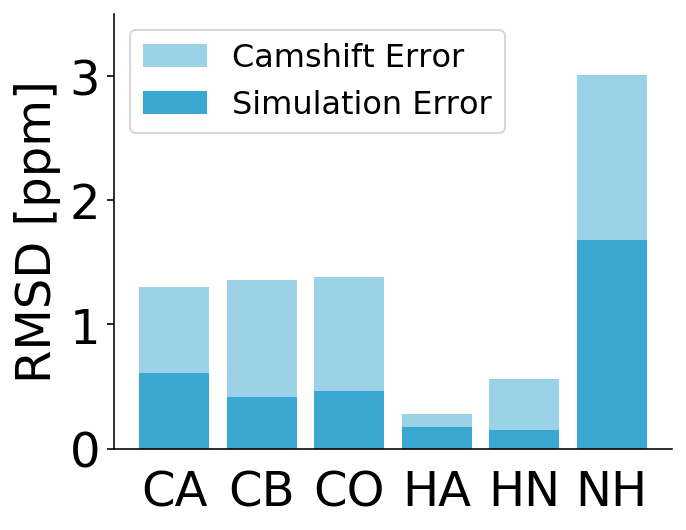

In [29]:
for k in ("apo", "control", "holo"):
    fig = plt.figure(figsize=(5, 4))
    ax = fig.add_subplot(111)
    ax.bar(np.arange(6), [d[1] for d in sorted(tuple(err.items()))], capsize=8,
           color=colors[5], alpha=0.5, label="Camshift Error")
    ax.bar(np.arange(6), [d[1] for d in rmsderr[k]],
           capsize=8, color=colors[5], label="Simulation Error")
    ax.set_xticks(np.arange(6))
    ax.set_xticklabels([d[0] for d in rmsderr[k]])
    ax.set_ylabel("RMSD [ppm]", fontsize=24)
    ax.set_ylim(0, 3.5)
    ax.tick_params(axis="x", length=0, pad=10, labelsize=24)
    ax.tick_params(axis="y", labelsize=24)
    sns.despine(ax=ax)
    ax.legend(fontsize=16)
    plt.savefig(f"figs/rmsd-cs-{k}.pdf", bbox_inches="tight", transparent=True)
    plt.savefig(f"figs/rmsd-cs-{k}.svg", bbox_inches="tight", transparent=True)

### Per-residue shifts

In [ ]:
n = 2
N = 10000
n_cs = cs[k][0].shape[1]
rmsd, rmsderr = {}, {}
for k in ("apo",):
    cs_stack = np.vstack(cs[k])
    inds = unflatten(np.arange(nframes[k]).reshape(-1, 1), lengths[k])
    csm = np.empty((attempts, N, n_cs))
    for i in range(attempts):
        generator = DataGenerator.from_state(inds, "models/model-idx-{0}-{1}.hdf5".format(k, i))
        idx = generator(n=n, lag=20).trains[0].flatten().astype(int)
        print("Processing k={0} i={1}...".format(k, i), end="\r")
        w = weights[k][n][i, idx]
        valid = np.isfinite(w)
        sample = np.random.choice(np.arange(nframes[k])[idx][valid], size=N,
                                  replace=False, p=w[valid] / w[valid].sum())
        csm[i] = cs_stack[sample]

In [ ]:
with open("trajectories/apo/r1cs/cs0000.dat") as f:
    raw = f.readline().split()

shifts_mask = defaultdict(lambda: np.zeros(nres, dtype=bool))
for entry in raw[3:3 + n_cs]:
    k = entry[3:5].upper()
    res_index = int(entry[6:])
    shifts_mask[k][res_index - 1] = 1

In [ ]:
shifts_full = {}
shifts_exp = {}
for k, ((s_begin, s_end), _) in labels.items():
    csf = csm.reshape(-1, n_cs)[:, s_begin:s_end]
    shifts_full[k] = np.full((N * attempts, nres), np.nan)
    shifts_full[k][:, shifts_mask[k]] = csf
    shifts_exp[k] = np.full(nres, np.nan)
    shifts_exp[k][shifts_mask[k]] = csexp[s_begin:s_end]

In [ ]:
for sim in sim_names:
    fig, axes = plt.subplots(len(labels), 1, figsize=(10, 4 * len(labels)), sharex=True)
    for i, k in enumerate(labels):
        ax = axes[i]
    #     bp = ax.boxplot(shifts_full[k], sym="", whis=[5, 95], meanline=False, widths=0.5,
    #                     patch_artist=False, medianprops=dict(color="k"), showmeans=False,
    #                     meanprops=dict(marker="o", markeredgecolor="k", markerfacecolor="white"))
        bp = ax.violinplot(shifts_full[k], showmeans=True, showmedians=False, widths=0.75)
        ax.plot(np.arange(nres) + 1, shifts_exp[k], marker="o", markersize=2, color="k", linewidth=0)
        for pc in bp["bodies"]:
            pc.set_color("k")
            pc.set_edgecolor("k")
            pc.set_facecolor("#a0a0a0")
            pc.set_alpha(1)
        cs_min, cs_max = labels[k][1]
        ax.set_ylim(cs_min, cs_max)
        ax.set_ylabel("Shift [ppm]", fontsize=24, labelpad=10)
        ax.set_title(k, fontsize=24)
        ax.set_xticks(np.arange(0, nres, 10) + 1)
        ax.set_xticks(np.arange(nres) + 1, minor=True)
        ax.tick_params(labelsize=24)
        ax.set_xticklabels([])

    ax.tick_params(axis="x", which="major", length=4, pad=20, labelsize=16)
    ax.tick_params(axis="x", which="minor", length=2, pad=0, labelsize=16)
    ax.set_xticklabels(np.arange(0, nres, 10), fontsize=24)

    res = [r.code for i, r in enumerate(topo.residues)]
    for i, r in enumerate(res):
        ax.text(i + 1, cs_min - 5, r, fontsize=16, horizontalalignment="center")

    plt.savefig(f"figs/cs-res-{sim}.pdf", transparent=True, bbox_inches="tight")
    plt.savefig(f"figs/cs-res-{sim}.svg", transparent=True, bbox_inches="tight")

### Implied timescales
The implied timescales are computed from the eigenvalues $\lambda_i$ of the Koopman operator $\mathbf{K}$ and the selected lag time $\tau$:
$$ t_i = \frac{-\tau}{\log | \lambda_i(\tau) |} $$
We compute the implied timescales for several lag times $\tau$. Ideally, we want to choose $\tau$ so that we're in a regime where the timescales are mostly independent of $\tau$. This is the case for lag times longer than $\tau = 12.5\,\mathrm{ns}$:

apo


findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


holo
control


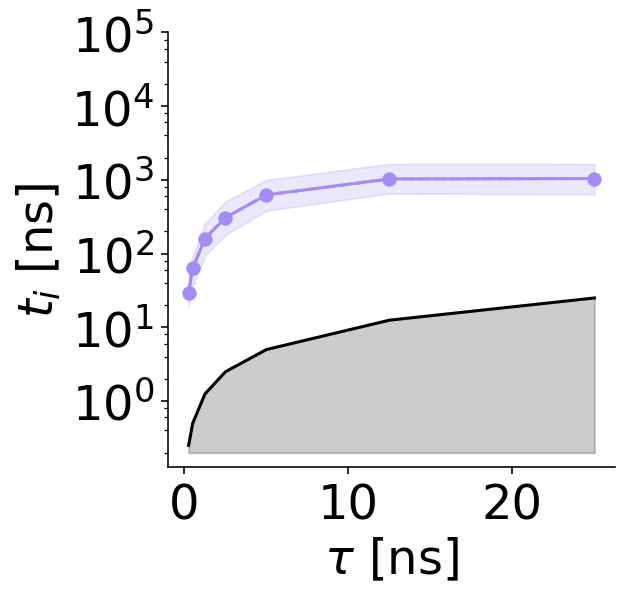

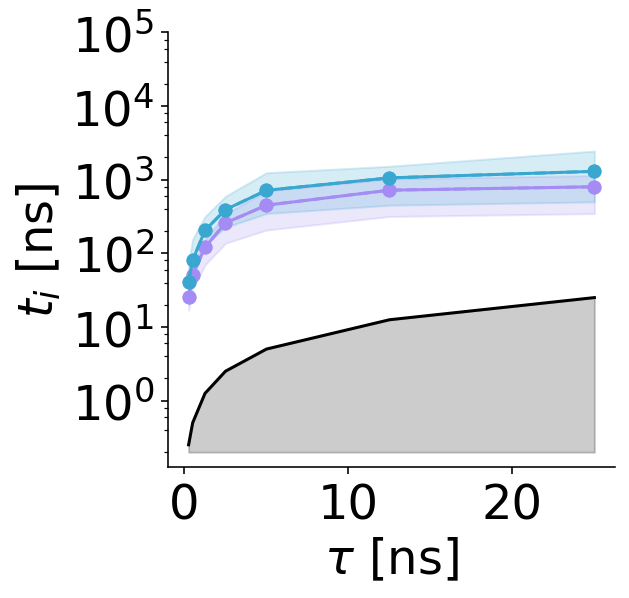

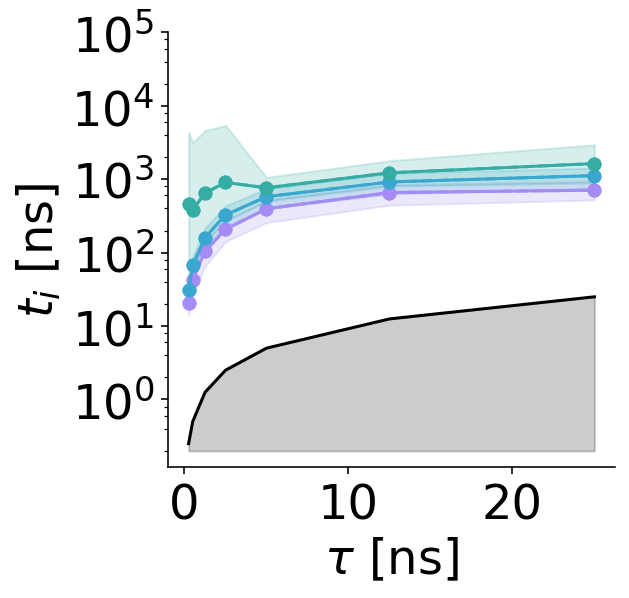

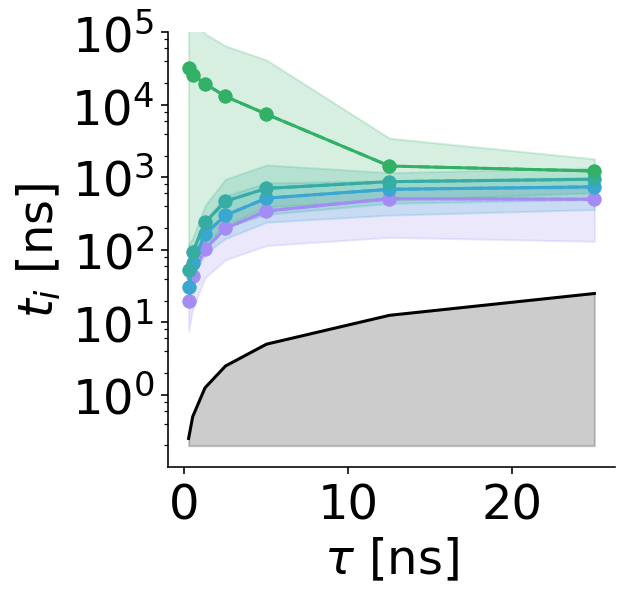

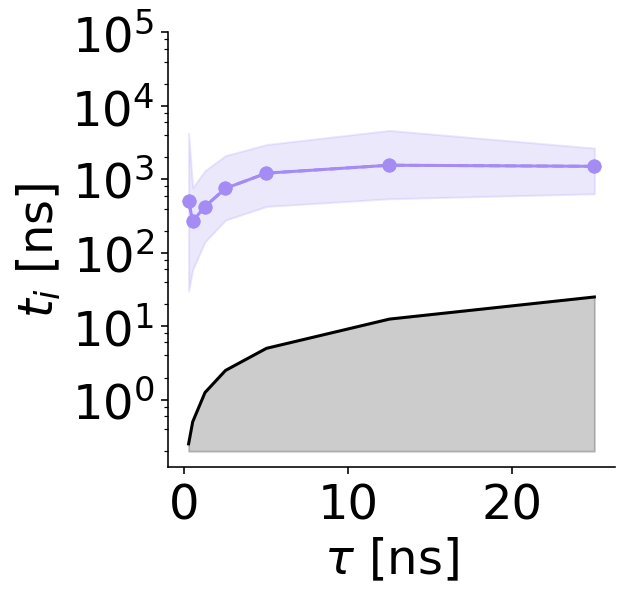

...

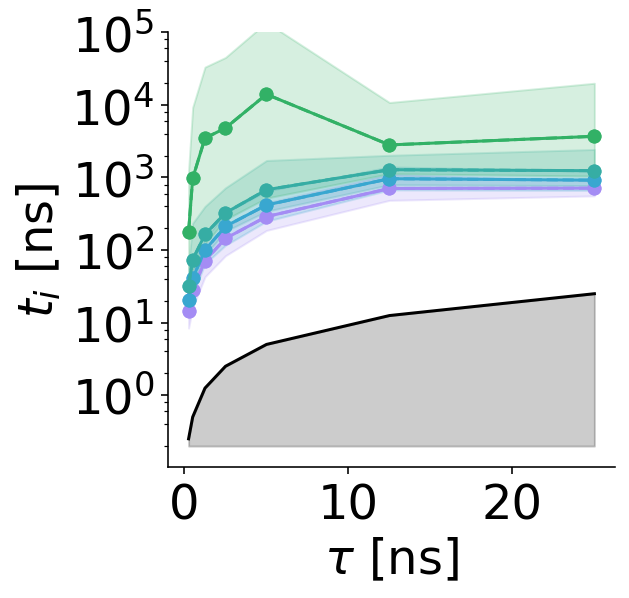

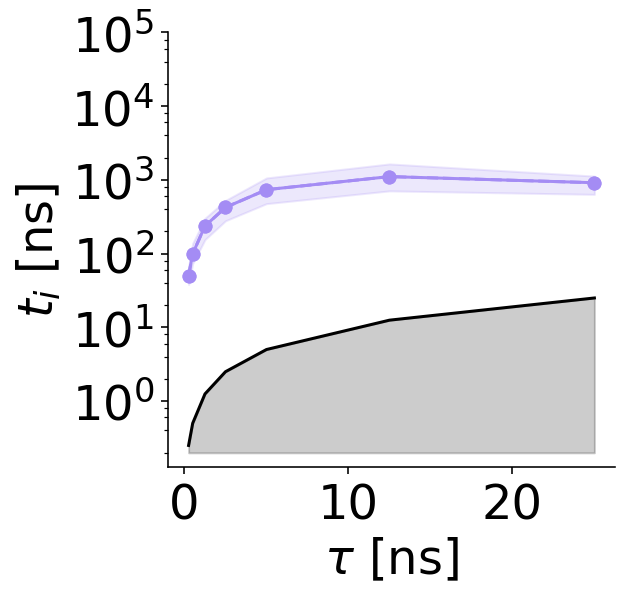

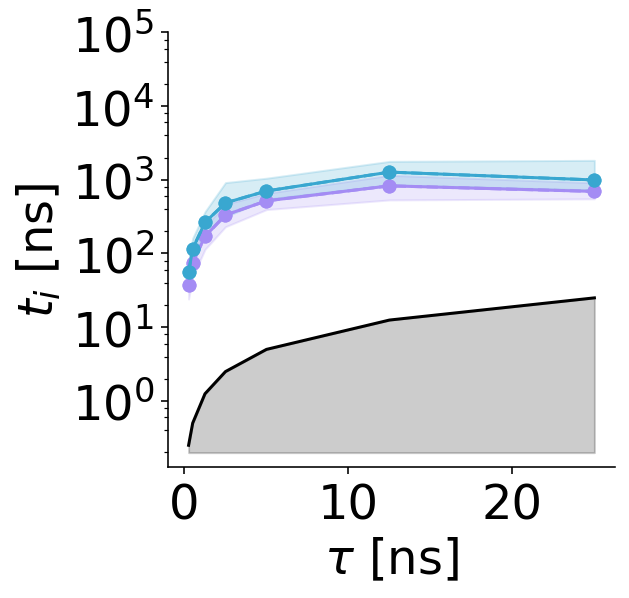

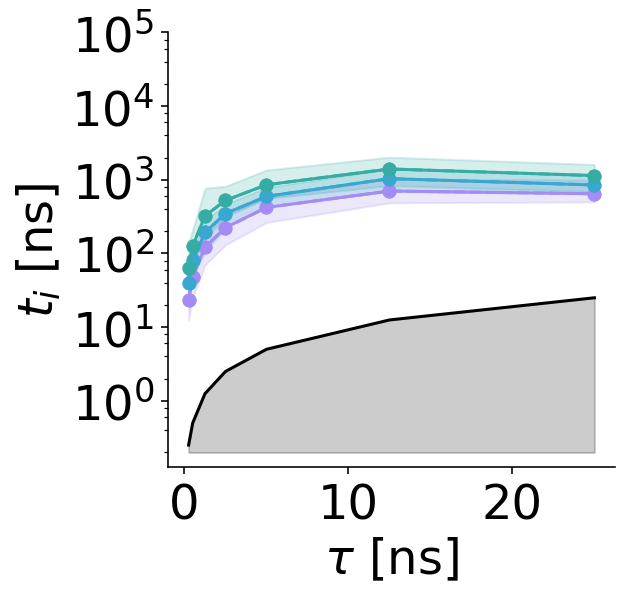

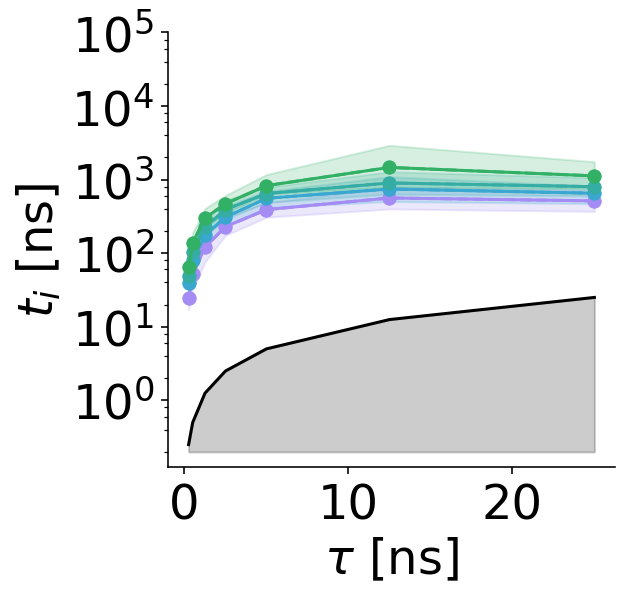

In [30]:
with h5py.File("intermediate/data.hdf5") as store:
    for k in sim_names:
        print(k)
        for n in outsizes:
            its = np.stack(store[f"{k}/{i}/{n}/its"] for i in range(attempts))
            fig = plot_its(its, lags, dt=dt)
            plt.savefig("figs/its-{0}-{1}.pdf".format(k, n), bbox_inches="tight", transparent=True)
            plt.savefig("figs/its-{0}-{1}.svg".format(k, n), bbox_inches="tight", transparent=True)

### Chapman-Kolmogorov Test
Now that we have found a Koopman operator $\mathbf{K}$, how do we know if it adequately describes the dynamical system?

There are a number of tests we can perform to ensure we have found a good approximation. One of the more stringent ones is the Chapman Kolmogorov (CK-test). It is based on the assumption that multiple applications of our operator to our system state at time $t$ should be equivalent to estimating the operator at a longer lag time $\tau$:

$$ \mathbf{K}(\tau)^n \approx \mathbf{K}(n\tau) $$

I.e., multiple applications of the operator should produce the same result as using an operator with a multiple of a certain lag time, within an error. This is a more stringent test of model quality than the implied timescales test described above.

apo
holo
control


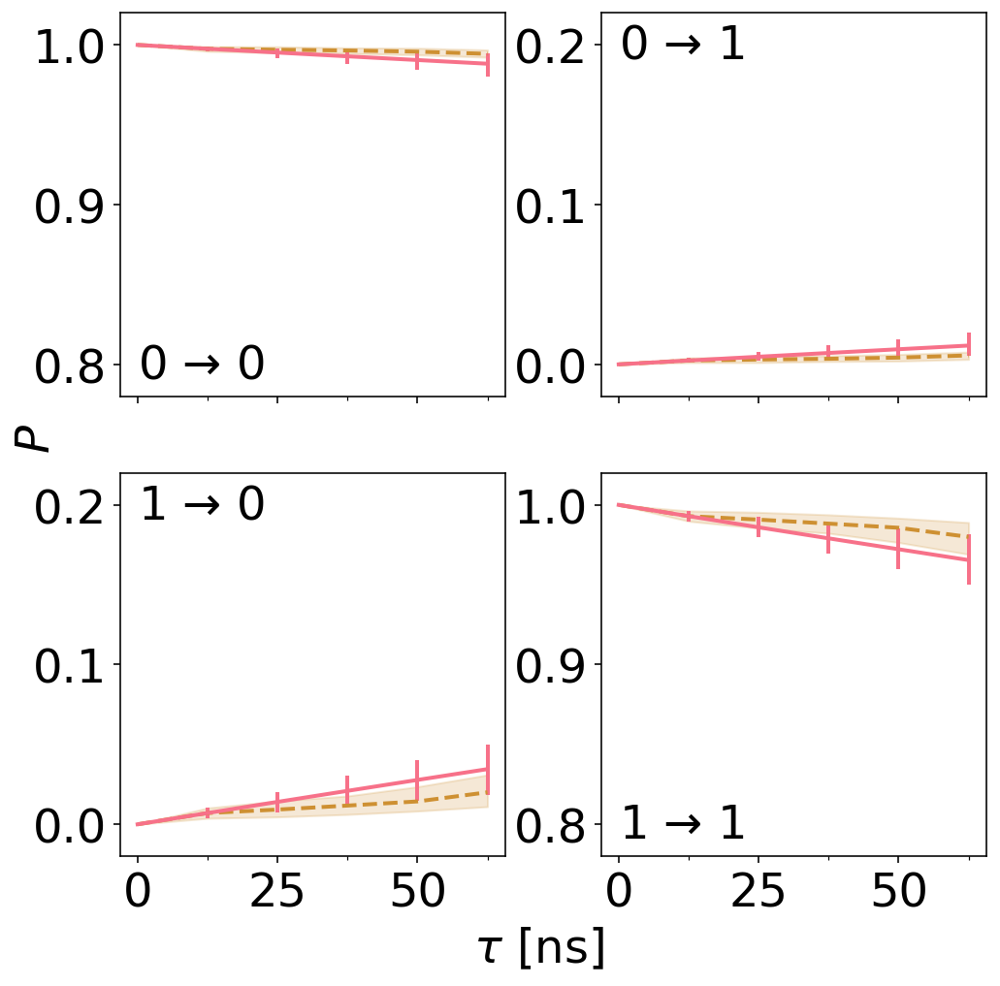

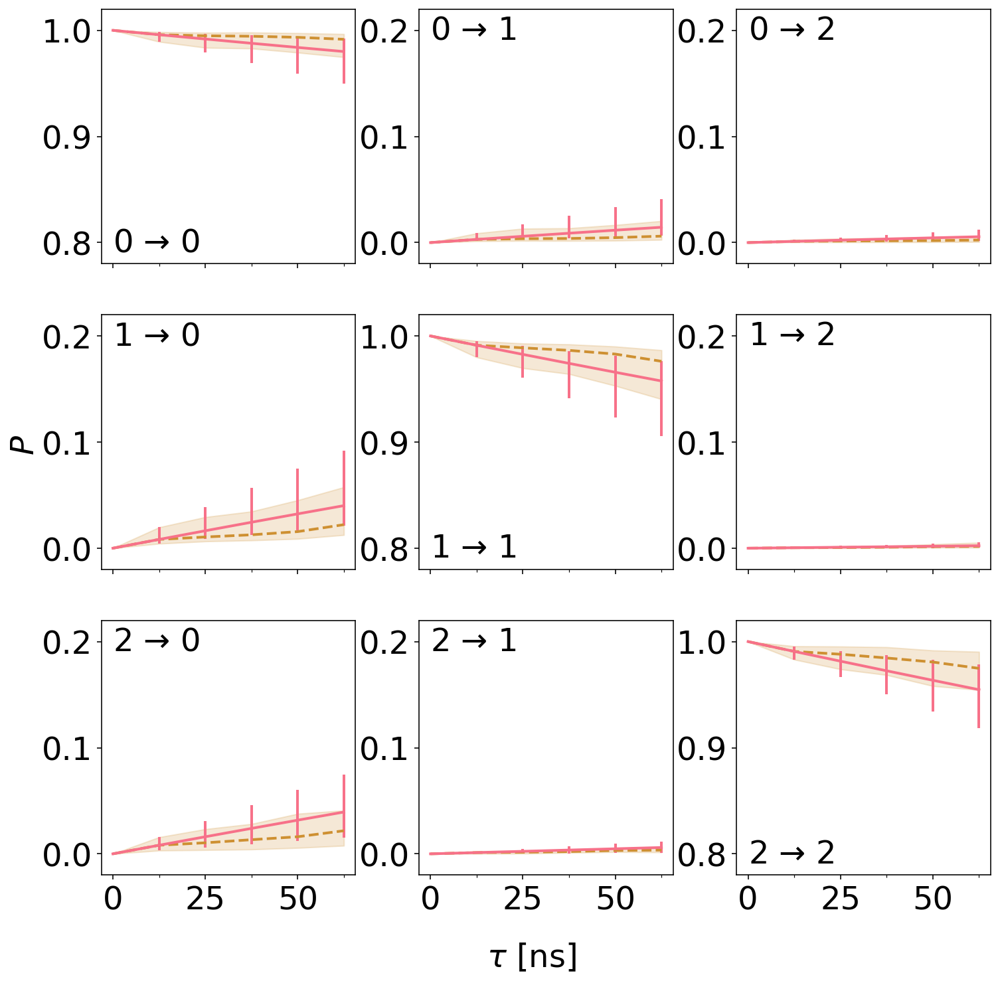

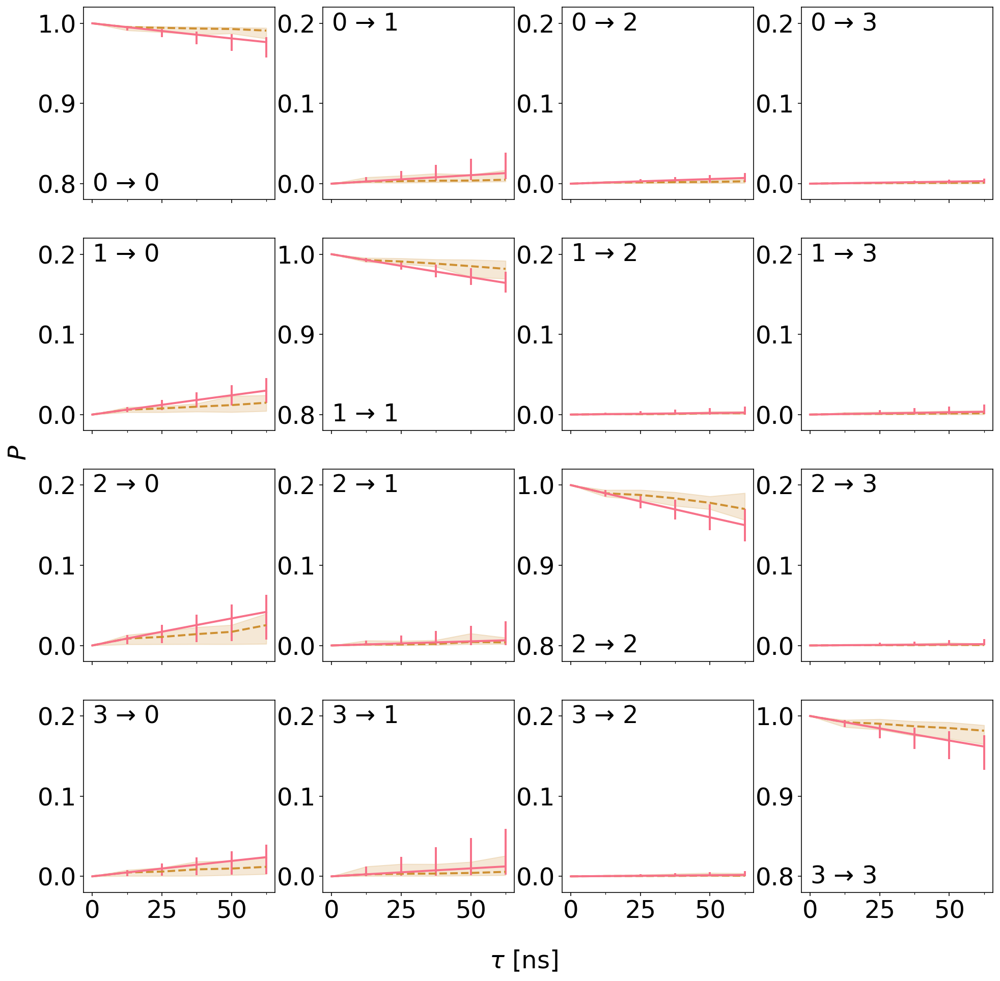

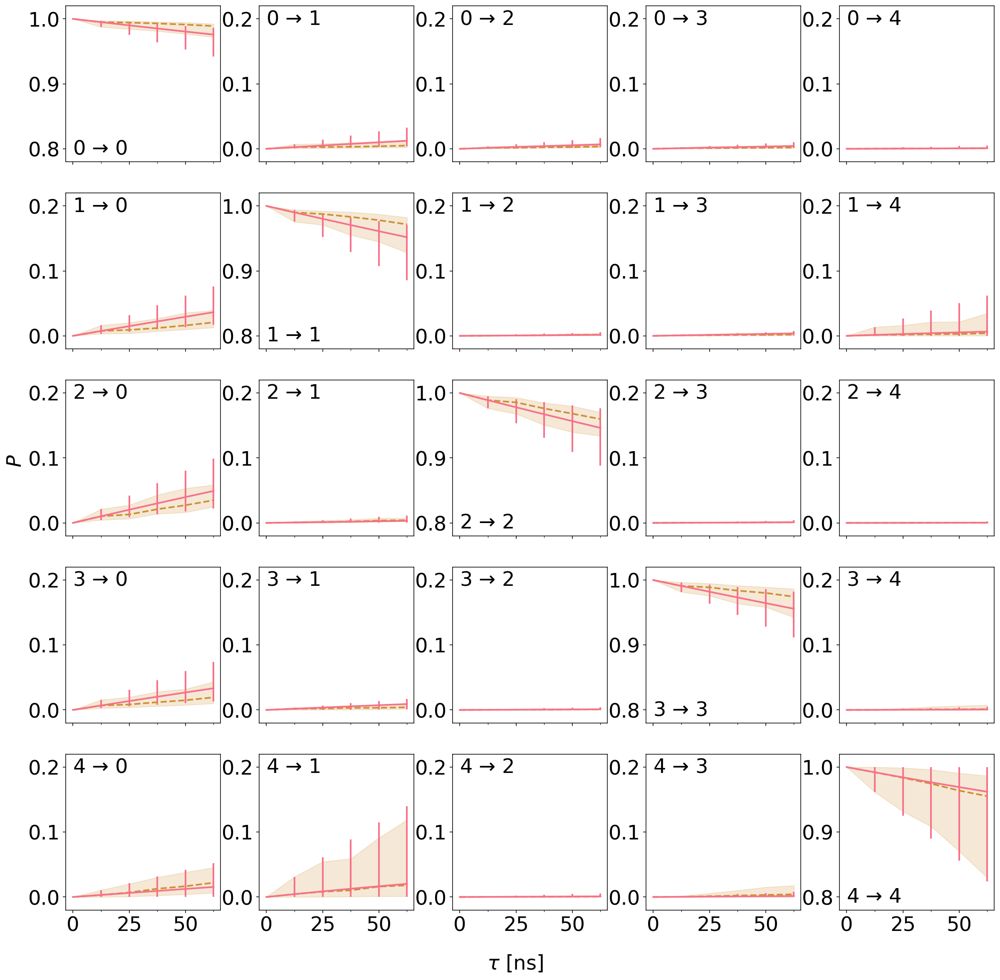

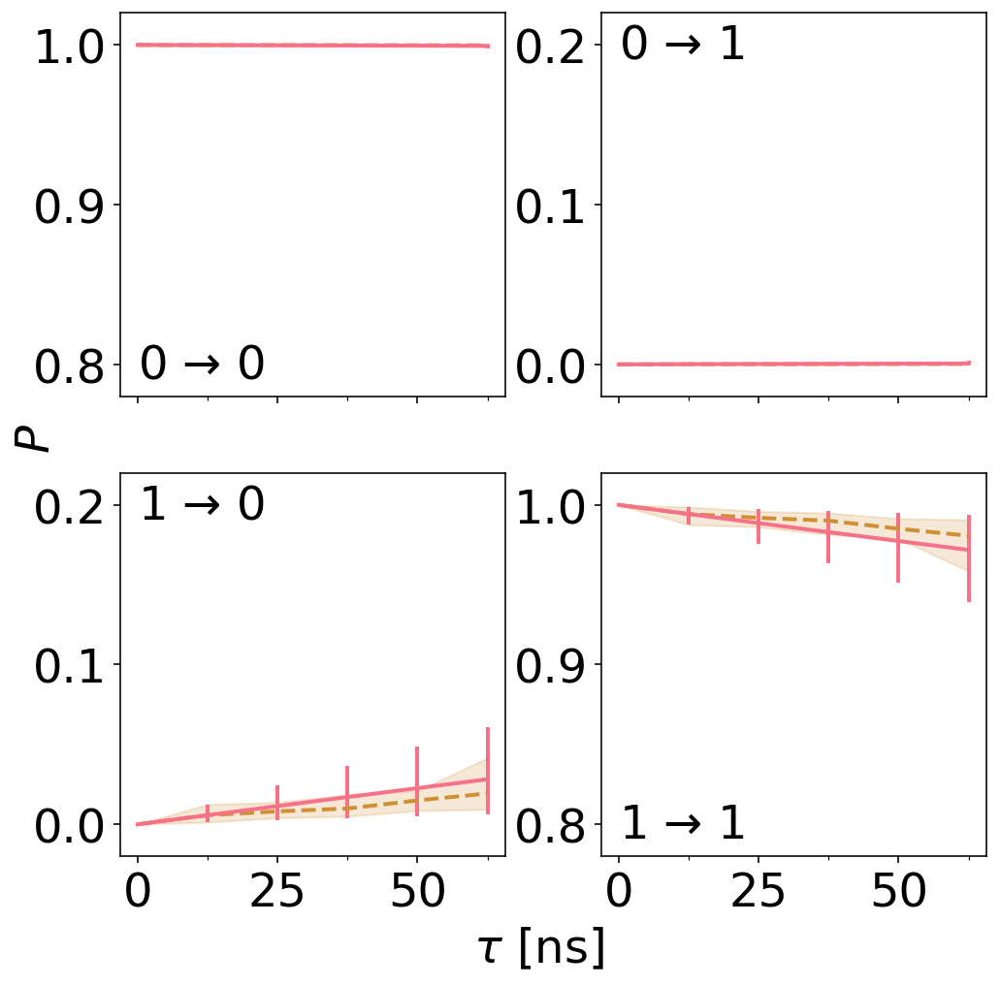

...

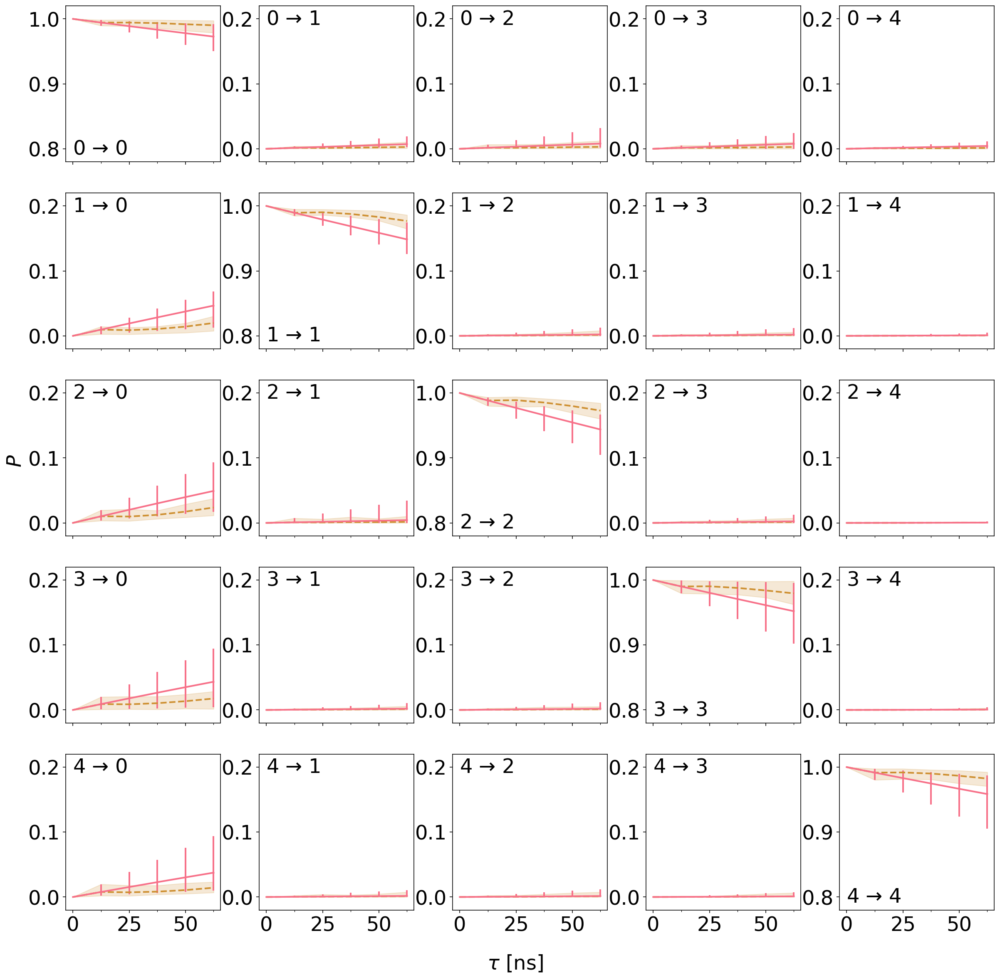

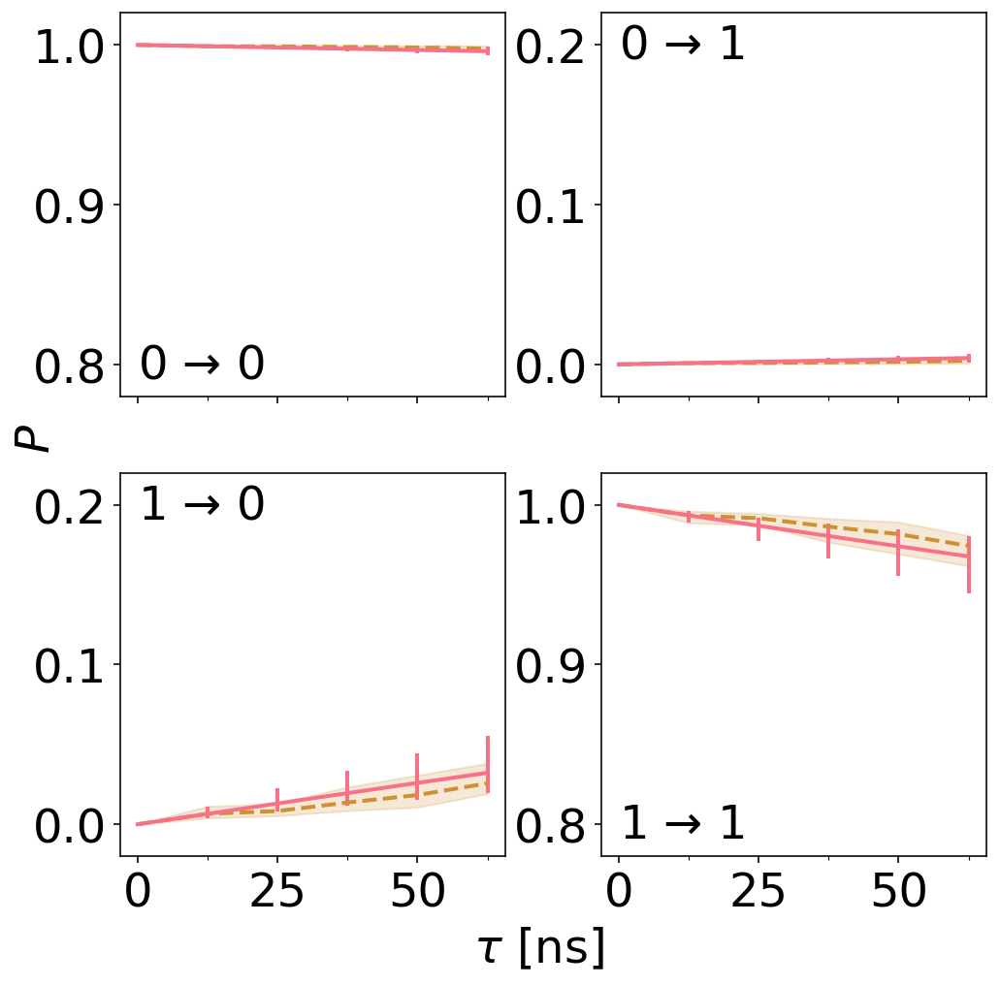

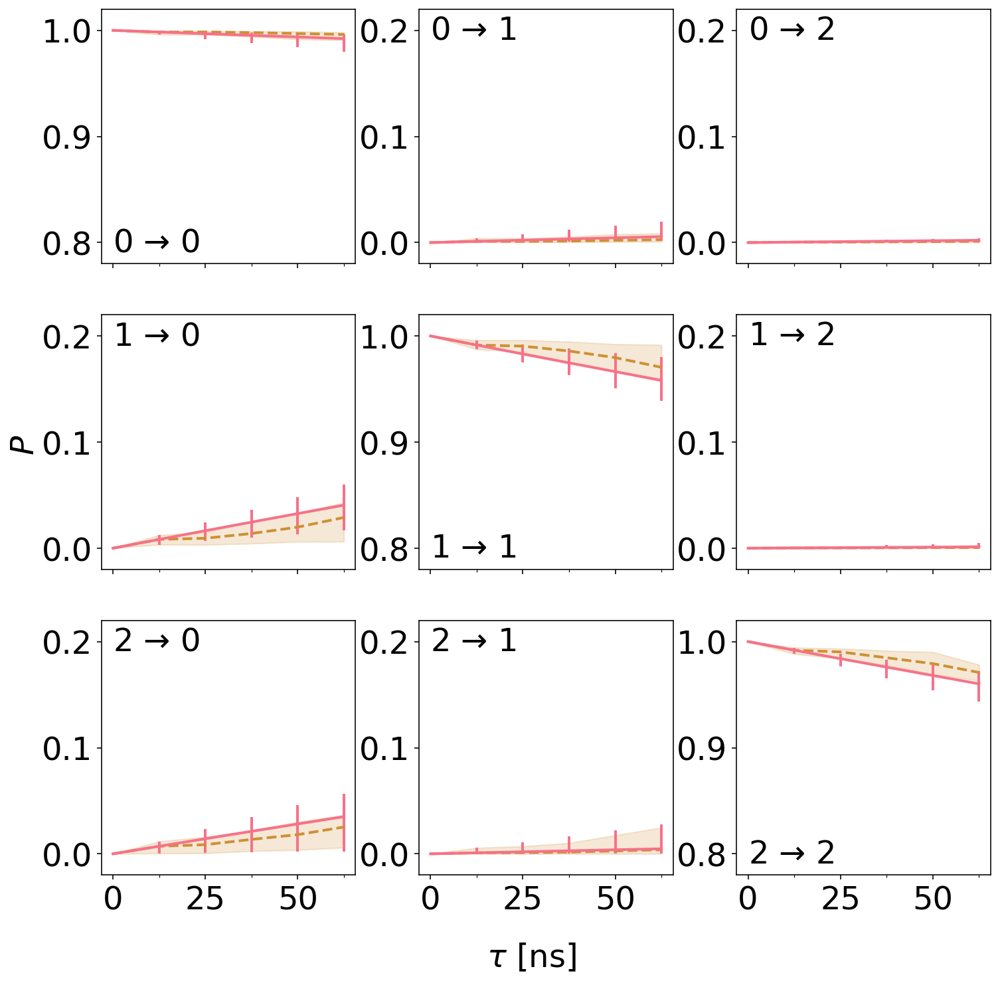

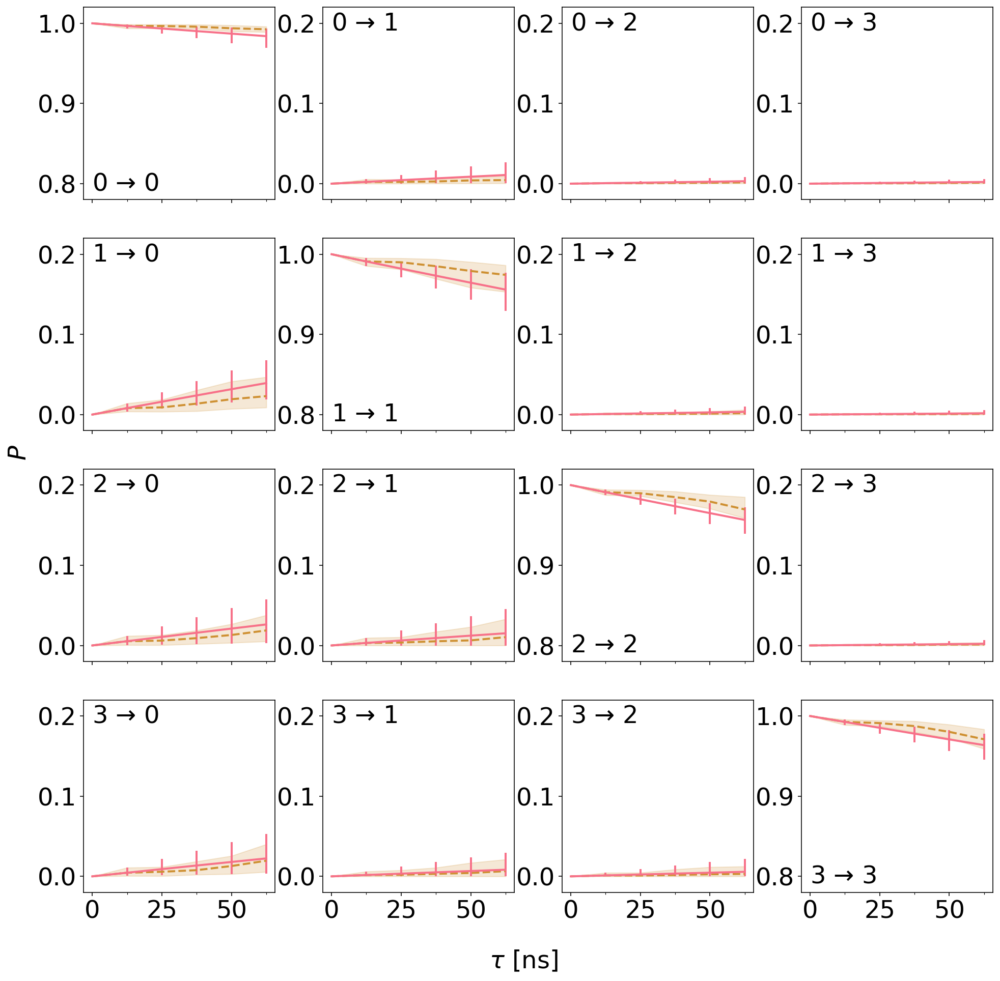

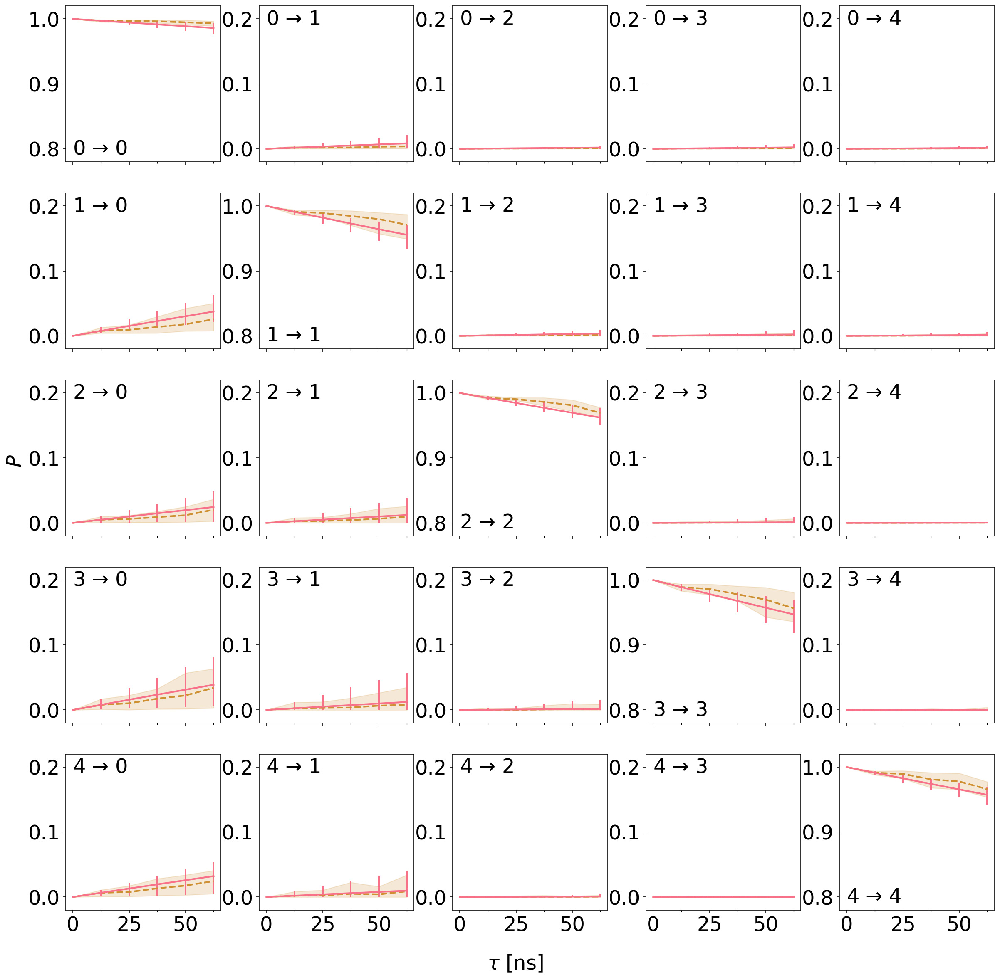

In [31]:
with h5py.File("intermediate/data.hdf5") as store:
    for k in sim_names:
        print(k)
        for n in outsizes:
            cke = np.stack(store["{0}/{1}/{2}/cke".format(k, i, n)][:][sorters[k][n][i]][:, sorters[k][n][i]]
                           for i in range(attempts))[:, global_sorter[k][n]][:, :, global_sorter[k][n]]
            ckp = np.stack(store["{0}/{1}/{2}/ckp".format(k, i, n)][:][sorters[k][n][i]][:, sorters[k][n][i]]
                           for i in range(attempts))[:, global_sorter[k][n]][:, :, global_sorter[k][n]]
            fig = plot_ck(cke, ckp, lag=50)
            plt.savefig("figs/ck-{0}-{1}.pdf".format(k, n), bbox_inches="tight", transparent=True)
            plt.savefig("figs/ck-{0}-{1}.svg".format(k, n), bbox_inches="tight", transparent=True)

### Contact maps
We calculate contact maps from inter-residue minimum distance matrices, using the bootstrapped state assignments:

In [34]:
cutoff = 0.8
contacts = {}
for k in sim_names:
    inds = unflatten(np.arange(nframes[k]).reshape(-1, 1), lengths[k])
    contacts[k] = {n: np.empty((attempts, n, nres, nres)) for n in outsizes}
    for i in range(attempts):
        generator = DataGenerator.from_state(inds, "models/model-idx-{0}-{1}.hdf5".format(k, i))
        idx = generator(n=4, lag=20).trains[0].flatten().astype(int)
        for n in outsizes:
            print("Processing k={0} n={1} i={2}...".format(k, n, i), end="\r")
            w = pfs[k][n][i, idx]
            in_contact = (mindist_flat[k][idx] < cutoff)
            con = (np.einsum("jk,jl->kl", w[np.isfinite(w).all(axis=1)], in_contact[np.isfinite(w).all(axis=1)]) /
                   w[np.isfinite(w).all(axis=1)].sum(axis=0).reshape(-1, 1))
            contacts[k][n][i] = np.asarray([triu_inverse(con[j], nres, offset=1)[0] for j in range(n)])

### Secondary structure
Secondary structure assignment with DSSP:

In [36]:
# Custom func makes this a lot easier
dssptable = str.maketrans("HBEGITS ", "01234567")
def dssp_enc(traj):
    raw = md.compute_dssp(traj.atom_slice(range(627)), simplified=False)
    return np.char.translate(raw, table=dssptable).astype(np.float32)

dssp = {}
for k in sim_names:
    feat = pe.coordinates.featurizer(top[k])
    feat.add_custom_func(dssp_enc, dim=42)
    inp = pe.coordinates.source(trajs[k], feat)
    dsspraw = np.vstack(inp.get_output()).astype(np.int32)

    # One-hot encoding
    nvals = dsspraw.max() + 1
    dsspoh = np.eye(nvals, dtype=np.int32)[dsspraw]

    # We could use the simplified DSSP scheme, but this gives us a bit more flexibility
    dssplow = np.empty((nframes[k], nres, 4))
    dssplow[:, :, 0] = dsspoh[:, :, [0, 3, 4]].sum(axis=-1)
    dssplow[:, :, 1] = dsspoh[:, :, [1, 2]].sum(axis=-1)
    dssplow[:, :, 2] = dsspoh[:, :, [5, 6]].sum(axis=-1)
    dssplow[:, :, 3] = dsspoh[:, :, 7]
    dssp[k] = dssplow

In [37]:
sec, secm, secs = {}, {}, {}
for k in sim_names:
    inds = unflatten(np.arange(nframes[k]).reshape(-1, 1), lengths[k])
    sec[k] = {n: np.empty((attempts, n, nres, 4)) for n in outsizes}
    for i in range(attempts):
        generator = DataGenerator.from_state(inds, "models/model-idx-{0}-{1}.hdf5".format(k, i))
        idx = generator(n=4, lag=20).trains[0].flatten().astype(int)
        for n in outsizes:
            print("Processing k={0} n={1} i={2}...".format(k, n, i), end="\r")
            w = pfs[k][n][i, idx]
            sec[k][n][i] = (np.einsum("ij,ikl->jkl", w[np.isfinite(w).all(axis=1)],
                                      dssp[k][idx][np.isfinite(w).all(axis=1)]) /
                            w[np.isfinite(w).all(axis=1)].sum(axis=0).reshape(-1, 1, 1))

    secm[k] = {n: sec[k][n].mean(axis=0)[global_sorter[k][n]] for n in outsizes}
    secs[k] = {n: np.percentile(sec[k][n], q=(2.5, 97.5), axis=0)[:, global_sorter[k][n]] for n in outsizes}

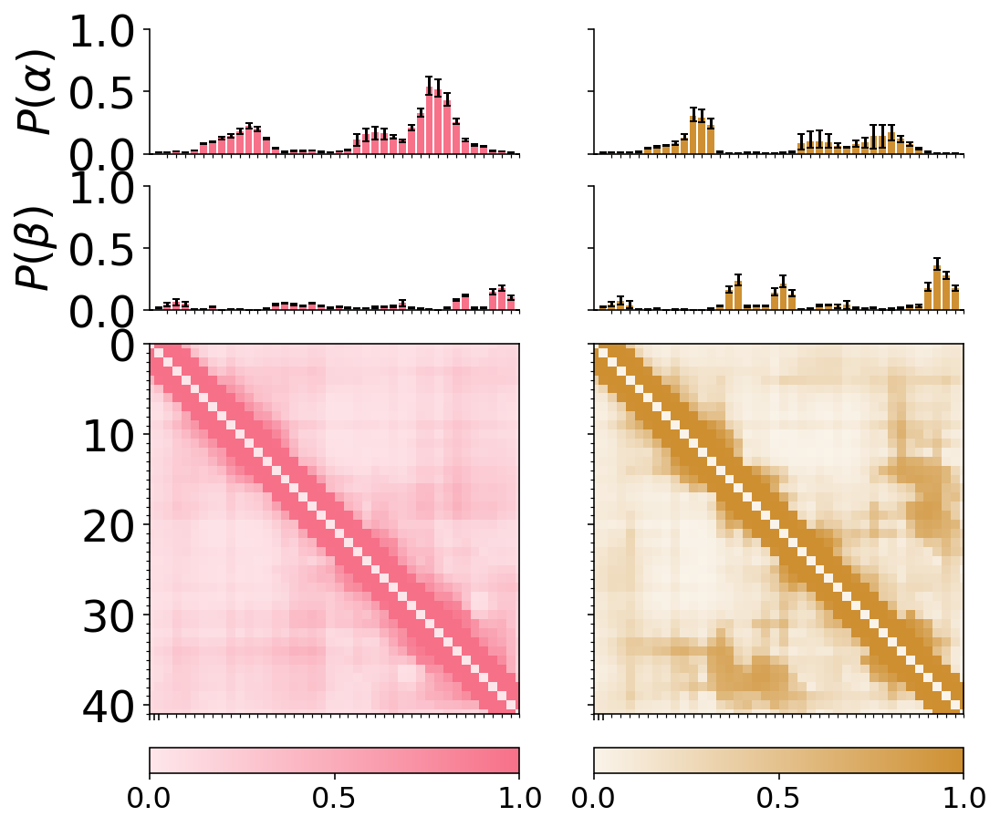

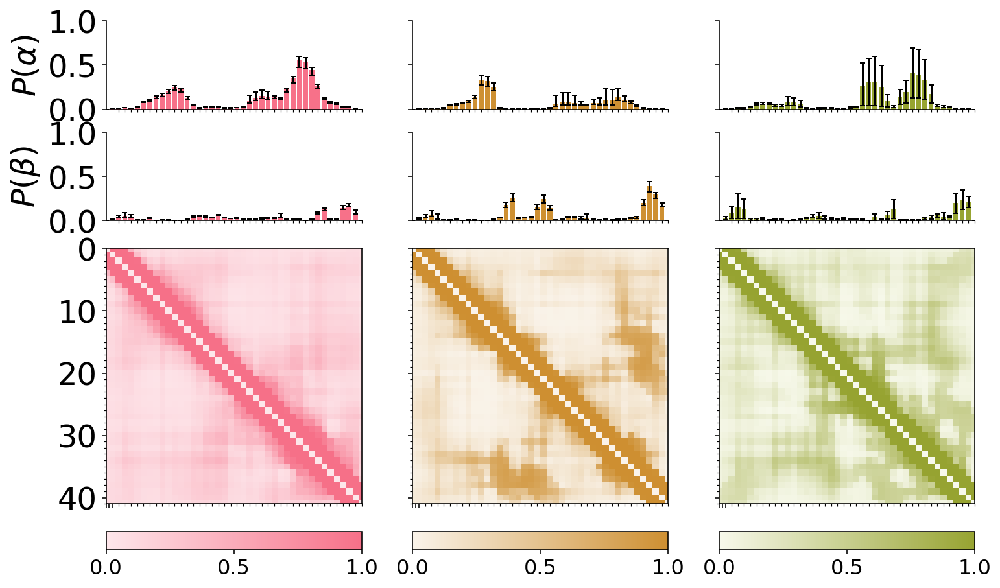

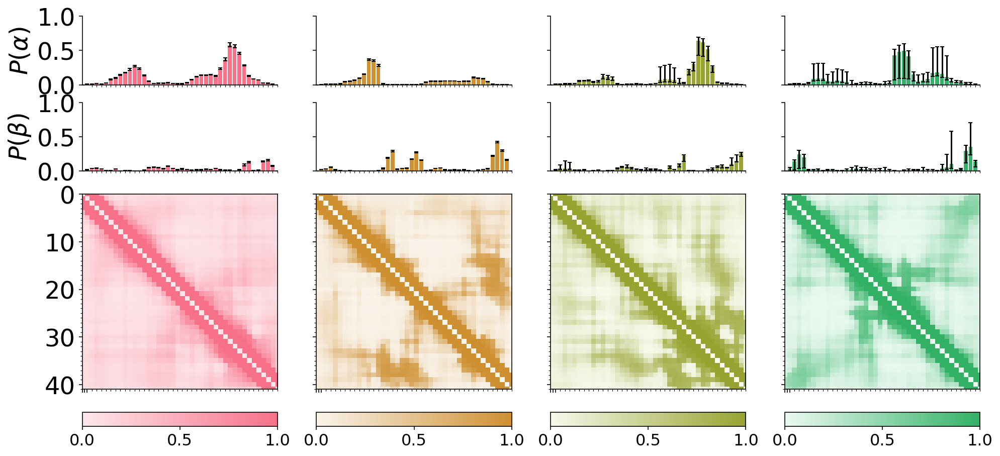

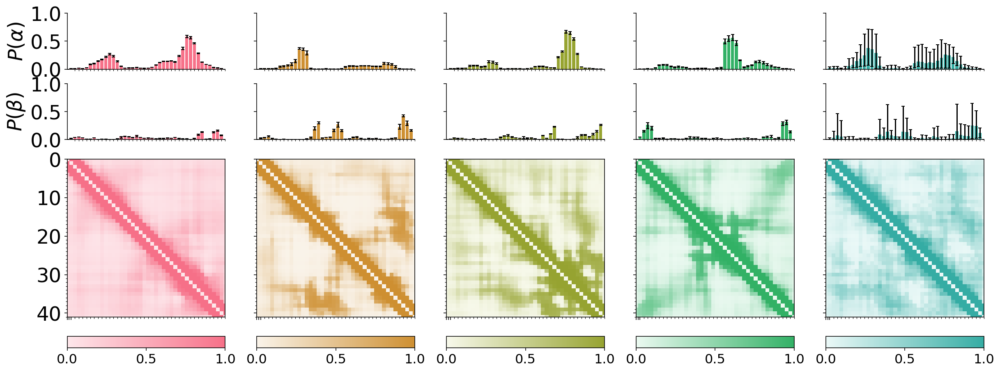

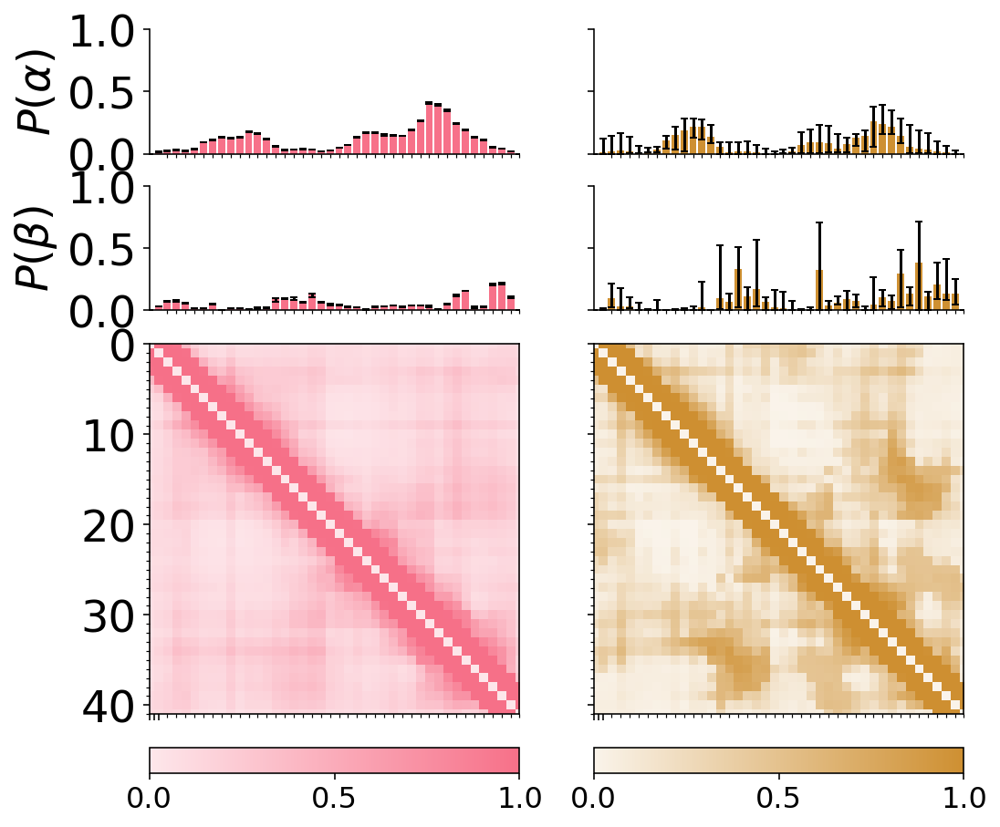

...

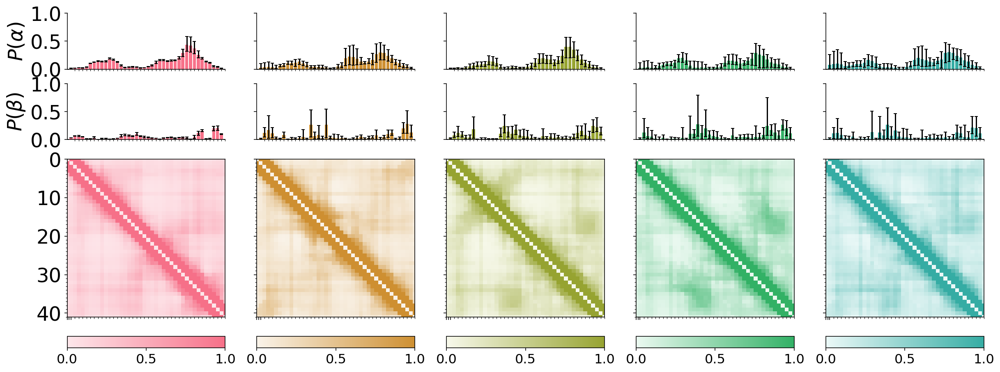

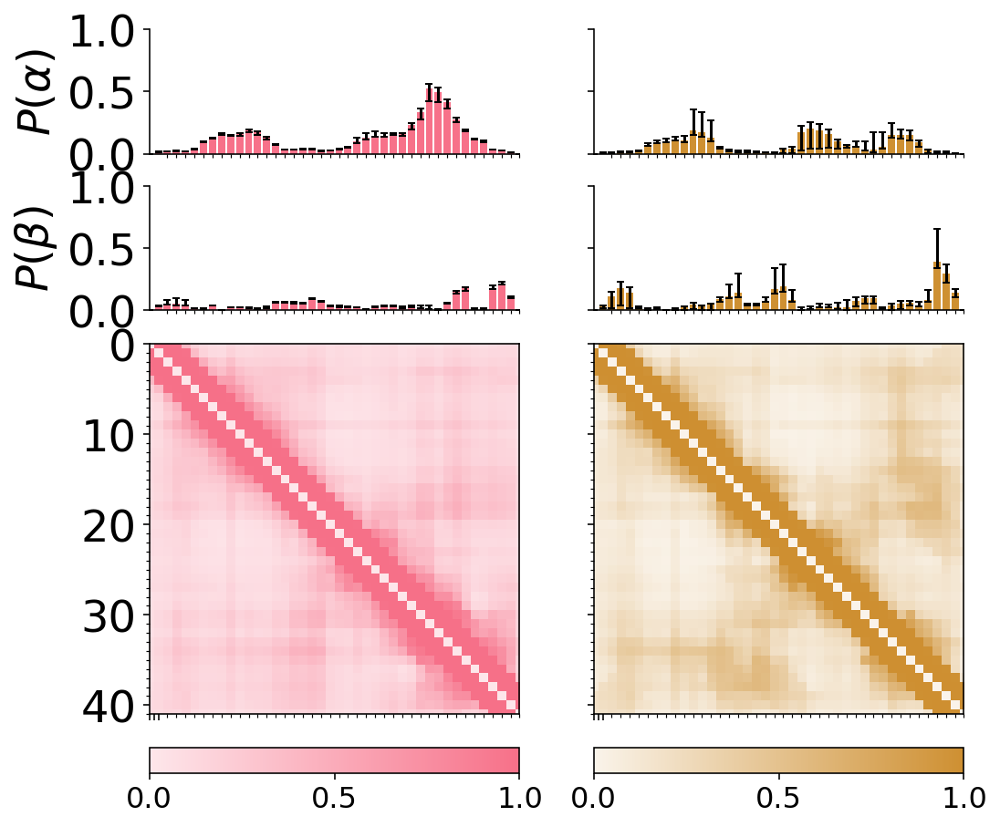

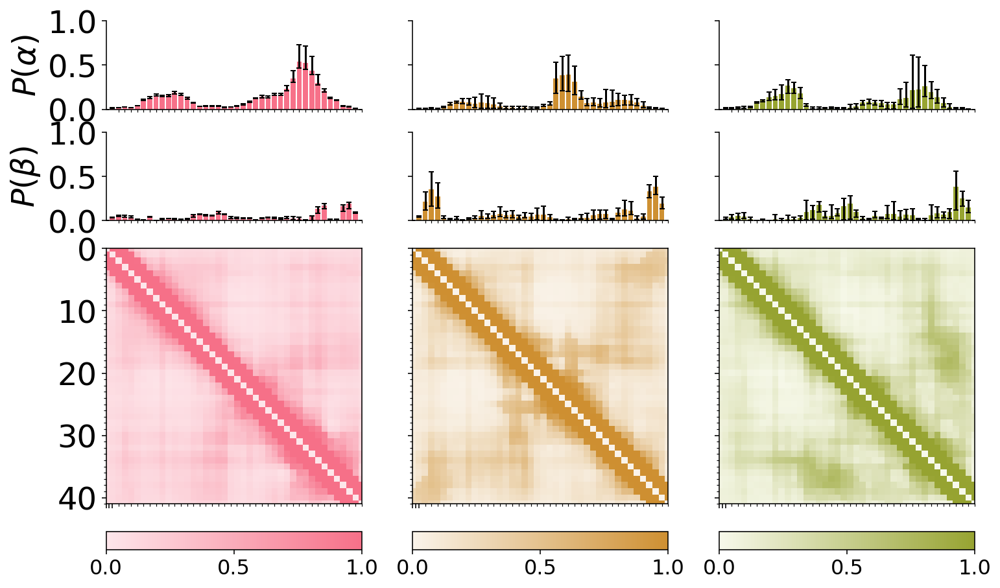

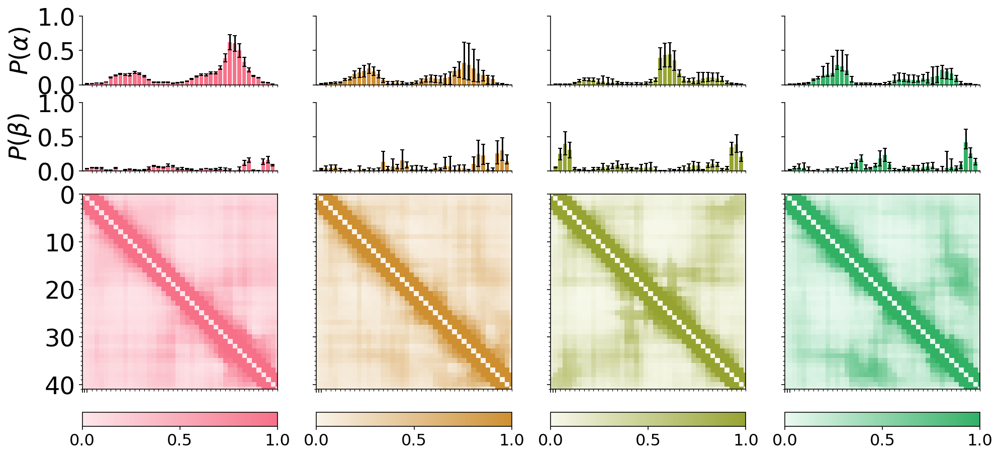

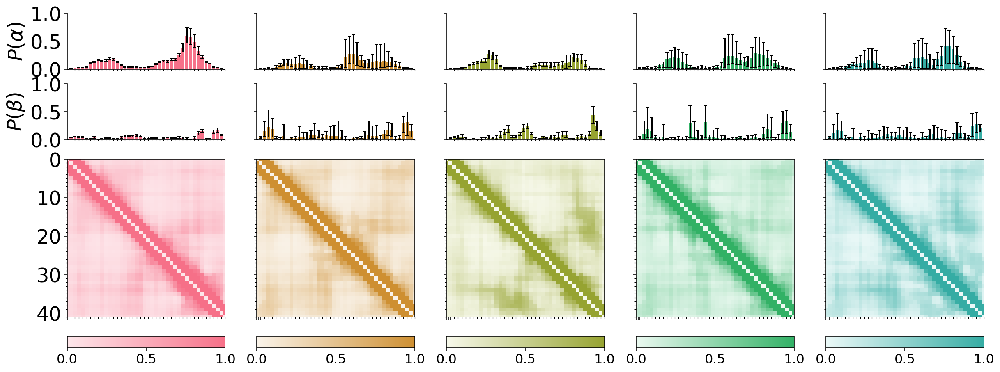

In [38]:
for k in sim_names:
    for n in outsizes:
        fig, axes = plt.subplots(4, n, figsize=(4 * n, 7.5), sharex=True,
                                 gridspec_kw={"height_ratios": [5, 5, 15, 1], "width_ratios": [3] * n})
        for i, axs in enumerate(axes.T):
            for j, ax in enumerate(axs[:2]):
                ax.bar(np.arange(nres), secm[k][n][i, :, j], yerr=[secm[k][n][i, :, j] - secs[k][n][0, i, :, j],
                                                                   secs[k][n][1, i, :, j] - secm[k][n][i, :, j]],
                       capsize=2, color=colors[i])
                sns.despine(ax=ax)
                ax.set_ylim(0, 1)
                if i == 0:
                    ax.set_ylabel([r"$P(\alpha)$", r"$P(\beta)$"][j], fontsize=24)
                else:
                    ax.set_yticklabels([])
                ax.set_yticks([0, 0.5, 1.0])
                ax.set_xticks(np.arange(0, 50, 10))
                ax.set_xticks(np.arange(0, 42, 1), minor=True)
                ax.set_xticklabels([])
                ax.tick_params(labelsize=24)
                ax.tick_params(axis="x", length=0, labelsize=12)

            ax = axs[2]
            dat = contacts[k][n].mean(axis=0)[global_sorter[k][n][i]]
            cmap = sns.light_palette(colors[i], as_cmap=True)
            im = ax.matshow(dat, vmin=0.0, vmax=1.0, interpolation="nearest", cmap=cmap)
            ax.xaxis.tick_bottom()
            ax.set_xticks(np.arange(0, 50, 10))
            ax.set_xticks(np.arange(0, 42, 1), minor=True)
            ax.set_yticks(np.arange(0, 50, 10))
            ax.set_yticks(np.arange(0, 42, 1), minor=True)
            ax.set_xticklabels(np.arange(0, 50, 10))
            if i != 0:
                ax.set_yticklabels([])
            ax.set_xlim(0, 41)
            ax.set_ylim(41, 0)
            ax.tick_params(labelsize=24)

            cax = axs[3]
            shared = cax.get_shared_x_axes()
            for a in shared.get_siblings(cax):
                shared.remove(a)
            fig.colorbar(im, cax=cax, fraction=0.046, pad=0.04, orientation="horizontal")
            cax.xaxis.set_ticks(np.arange(0, 1.5, 0.5))
            cax.set_xticklabels(np.arange(0, 1.5, 0.5))
            cax.tick_params(labelsize=16)
            ax.set_xticks(np.arange(0, 50, 10))
            ax.set_xticks(np.arange(0, 42, 1), minor=True)
            ax.set_yticks(np.arange(0, 50, 10))
            ax.set_yticks(np.arange(0, 42, 1), minor=True)
            ax.set_xticklabels(np.arange(0, 50, 10))

            cax.xaxis.set_ticks(np.arange(0, 1.5, 0.5))
            cax.set_xticklabels(np.arange(0, 1.5, 0.5))
            cax.tick_params(labelsize=16)
        plt.savefig("figs/structure-{0}-{1}.pdf".format(k, n), bbox_inches="tight", transparent=True)
        plt.savefig("figs/structure-{0}-{1}.svg".format(k, n), bbox_inches="tight", transparent=True)

### Dihedrals
We will use dihedrals for some entropy and autocorrelation estimations:

In [39]:
dih = {}
for k in sim_names:
    feat = pe.coordinates.featurizer(top[k])
    feat.add_backbone_torsions()
    inpdih = pe.coordinates.source(trajs[k], feat)
    dih[k] = np.vstack(inpdih.get_output())

In [40]:
scdih = {}
for k in sim_names:
    feat = pe.coordinates.featurizer(top[k])
    feat.add_sidechain_torsions()
    inpscdih = pe.coordinates.source(trajs[k], feat)
    scdih[k] = np.vstack(inpscdih.get_output())

## Entropy

### Sidechain entropy
Information entropy on sidechain $\chi_i$ dihedrals:

In [42]:
n_chi1 = 32
n = 2
n_bins = 100
sc_single = {}
for k in sim_names:
    inds = unflatten(np.arange(nframes[k]).reshape(-1, 1), lengths[k])
    sc_single[k] = np.empty((attempts, n_chi1, n_bins))
    for i in range(attempts):
        generator = DataGenerator.from_state(inds, "models/model-idx-{0}-{1}.hdf5".format(k, i))
        idx = generator(n=2, lag=20).trains[0].flatten().astype(int)
        print("Processing k={0} n={1} i={2}...".format(k, n, i), end="\r")

        # We get the valid (not NaN) bagging state assignments
        w = weights[k][n][i, idx]
        valid = np.isfinite(w)

        # Raw backbone dihedrals are interlaced
        for j, chi in enumerate(scdih[k].T[:n_chi1]):
            sc_single[k][i, j], xe = np.histogram(chi[idx][valid], bins=n_bins, range=(-np.pi, np.pi),
                                    weights=w[valid], density=True)

In [43]:
chi1s = np.array([int(f.split()[-1]) for f in feat.describe()[:32]])
scents_single = {}
for k in sim_names:
    scents_single[k] = -np.nansum(sc_single[k] * np.log2(sc_single[k]), axis=-1)

scents_pad = {}
for k in sim_names:
    scents_pad[k] = np.full((attempts, nres), np.nan)
    scents_pad[k][:, chi1s - 1] = scents_single[k]

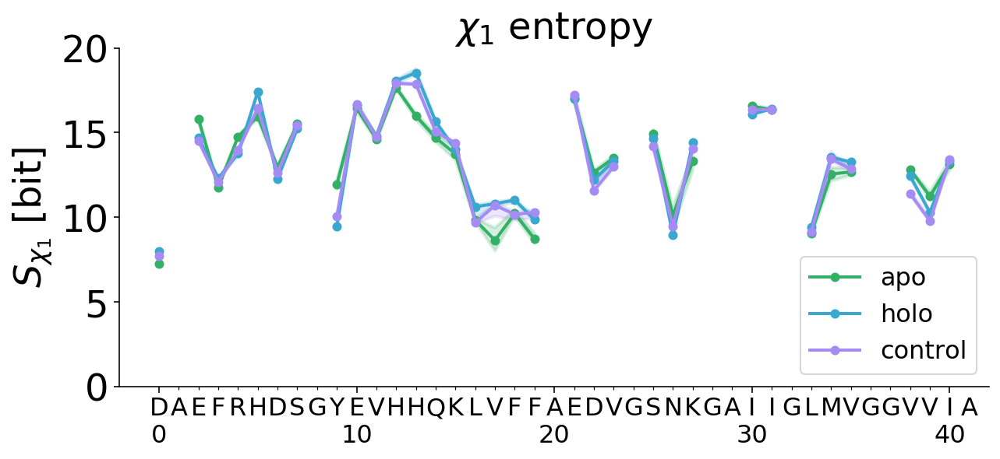

In [44]:
n = 2
x = np.arange(nres)
fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot(111)
for j, k in enumerate(("apo", "holo", "control")):
    dhe = scents_pad[k]
    dihent_m = dhe.mean(axis=0)
    dihent_l, dihent_h = np.percentile(dhe, q=(2.5, 97.5), axis=0)
    ax.plot(x, dihent_m, linewidth=2, color=colormap[k], label=k, marker="o", markersize=5)
    ax.fill_between(x, dihent_l, dihent_h, linewidth=2, color=colormap[k], alpha=0.2)
sns.despine(ax=ax)
ax.set_ylim(0, 20)
ax.set_ylabel(r"$S_{\chi_1}$ [bit]", fontsize=24)
ax.set_xticks(np.arange(0, nres, 10))
ax.set_xticks(np.arange(nres - 1), minor=True)
ax.tick_params(labelsize=24)
ax.tick_params(axis="x", which="major", length=4, pad=20, labelsize=16)
ax.tick_params(axis="x", which="minor", length=2, pad=0, labelsize=16)

res = [r.code for i, r in enumerate(topo.residues)]
for i, r in enumerate(res):
    ax.text(i, -1.7, r, fontsize=16, horizontalalignment="center")

ax.set_title("$\chi_1$ entropy", fontsize=24)
ax.legend(fontsize=16);
plt.savefig("figs/ents-scdih-seq.pdf", transparent=True, bbox_inches="tight")
plt.savefig("figs/ents-scdih-seq.svg", transparent=True, bbox_inches="tight")

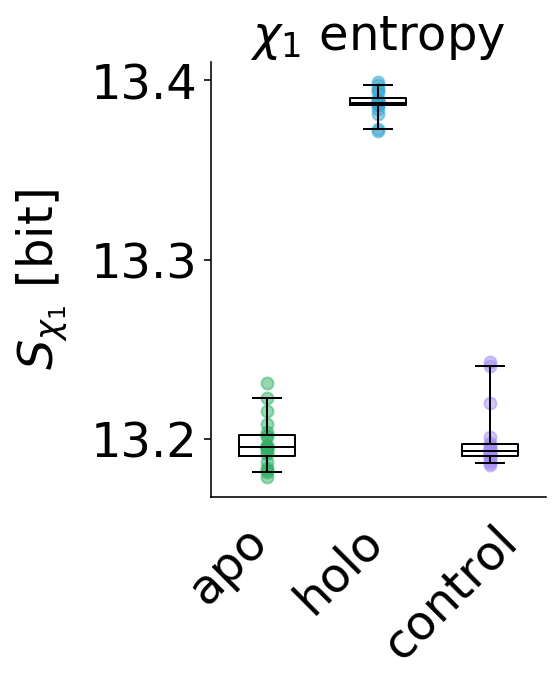

In [45]:
i = 0
ents = {k: scents_single[k].mean(axis=-1) for k in sim_names[:3]}
fig = plt.figure(figsize=(3, 4))
ax = fig.add_subplot(111)
for i, k in enumerate(sim_names[:3]):
    ax.plot(np.repeat([i + 1], attempts), ents[k], c=colormap[k], marker="o", linewidth=0, alpha=0.5)
    
bp = ax.boxplot(list(ents.values()), sym="", whis=[5, 95], meanline=False, widths=0.5,
                patch_artist=False, medianprops=dict(color="k"), showmeans=False,
                meanprops=dict(marker="o", markeredgecolor="k", markerfacecolor="white"))

# ax.set_ylim(585, 615)
ax.set_xticks(np.arange(len(sim_names[:3])) + 0.65)
ax.set_xticklabels(sim_names, fontsize=24, rotation=45)
ax.set_ylabel(r"$S_{\chi_1}$ [bit]", fontsize=24, labelpad=10)
ax.tick_params(labelsize=24)
ax.tick_params(axis="x", length=0, pad=10)
ax.set_title("$\chi_1$ entropy", fontsize=24)
sns.despine(ax=ax)
plt.savefig("figs/ent-scdih.pdf", bbox_inches="tight", transparent=True)
plt.savefig("figs/ent-scdih.svg", bbox_inches="tight", transparent=True)

### Dihedral autocorrelation
Because angles are periodic, we need to use a circular autocorrelation:

In [46]:
def circular_mean(a: np.ndarray, weights: np.ndarray, axis: int=None):
    return np.arctan2((weights.reshape(-1, 1) * np.sin(a)).sum(axis=axis),
                      (weights.reshape(-1, 1) * np.cos(a)).sum(axis=axis))

In [47]:
def autocorr_periodic(a: np.ndarray, b: np.ndarray, wa: np.ndarray, wb: np.ndarray,
                      wfunc=lambda wa, wb: wa * wb) -> np.ndarray:
    wa /= wa.sum()
    wb /= wb.sum()
    w = wfunc(wa, wb)
    w /= w.sum()
    ma = circular_mean(a, weights=wa, axis=0)
    mb = circular_mean(b, weights=wb, axis=0)
    cov = (w.reshape(-1, 1) * np.sin(a - ma) * np.sin(b - mb)).sum(axis=0)
    va = (wa.reshape(-1, 1) * np.sin(a - ma) ** 2).sum(axis=0)
    vb = (wb.reshape(-1, 1) * np.sin(b - mb) ** 2).sum(axis=0)
    return cov / np.sqrt(va * vb)

#### $\chi_1$ autocorrelations

In [49]:
n_chi1 = 32
n = 2
sc_corrs = {}
for k in sim_names:
    inds = unflatten(np.arange(nframes[k]).reshape(-1, 1), lengths[k])
    sc_corrs[k] = np.empty((attempts, n_chi1))
    for i in range(attempts):
        generator = DataGenerator.from_state(inds, "models/model-idx-{0}-{1}.hdf5".format(k, i))
        idxa, idxb = [x.astype(int) for x in generator(n=2, lag=20).trains]
        print("Processing k={0} n={1} i={2}...".format(k, n, i), end="\r")

        # We get the valid (not NaN) bagging state assignments
        wa = weights[k][n][i, idxa]
        wb = weights[k][n][i, idxb]
        valid = np.isfinite(wa) & np.isfinite(wb)
        a = scdih[k][:, :n_chi1][idxa][valid]
        b = scdih[k][:, :n_chi1][idxb][valid]

        # Raw backbone dihedrals are interlaced
        sc_corrs[k][i] = autocorr_periodic(a, b, wa[valid], wb[valid])

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


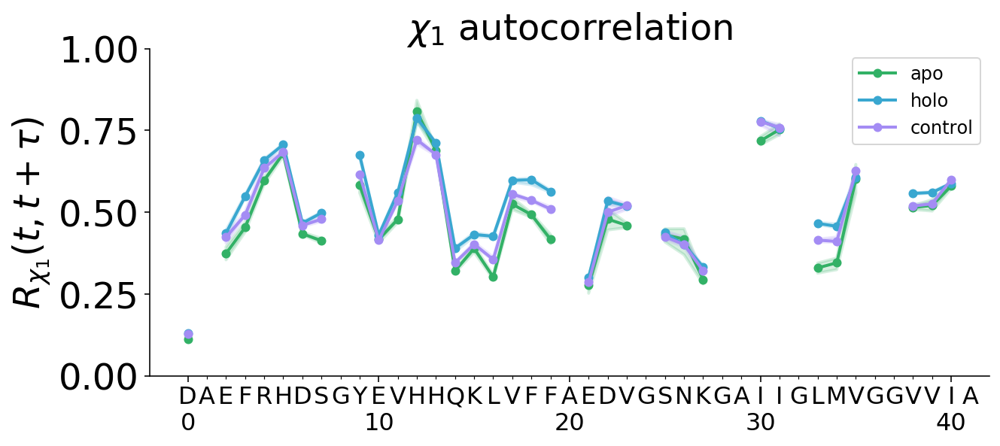

In [50]:
x = np.arange(nres)
fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot(111)
for j, k in enumerate(("apo", "holo", "control")):
    dhe = np.full((attempts, nres), np.nan)
    dhe[:, chi1s - 1] = sc_corrs[k]
    dihent_m = dhe.mean(axis=0)
    dihent_l, dihent_h = np.percentile(dhe, q=(2.5, 97.5), axis=0)
    ax.plot(x, dihent_m, linewidth=2, color=colormap[k], label=k, marker="o", markersize=5)
    ax.fill_between(x, dihent_l, dihent_h, linewidth=2, color=colormap[k], alpha=0.2)
sns.despine(ax=ax)
ax.set_ylim(0, 1)
ax.set_ylabel(r"$R_{\chi_1} (t, t + \tau)$", fontsize=24)
ax.set_xticks(np.arange(0, nres, 10))
ax.set_xticks(np.arange(nres - 1), minor=True)
ax.tick_params(labelsize=24)
ax.tick_params(axis="x", which="major", length=4, pad=20, labelsize=16)
ax.tick_params(axis="x", which="minor", length=2, pad=0, labelsize=16)

res = [r.code for i, r in enumerate(topo.residues)]
for i, r in enumerate(res):
    ax.text(i, -0.085, r, fontsize=16, horizontalalignment="center")

ax.set_title("$\chi_1$ autocorrelation", fontsize=24)
ax.legend(fontsize=12);
plt.savefig("figs/autocorr-scdih.pdf", transparent=True, bbox_inches="tight")
plt.savefig("figs/autocorr-scdih.svg", transparent=True, bbox_inches="tight")

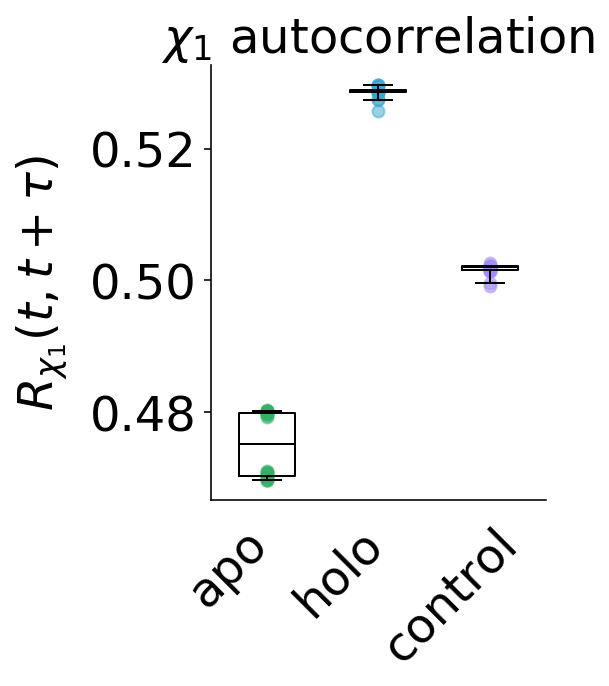

In [51]:
corrs_all = {k: sc_corrs[k].mean(axis=-1) for k in sim_names}
fig = plt.figure(figsize=(3, 4))
ax = fig.add_subplot(111)
for i, k in enumerate(sim_names[:3]):
    ax.plot(np.repeat([i + 1], attempts), corrs_all[k], c=colormap[k], marker="o", linewidth=0, alpha=0.5)
    
bp = ax.boxplot(list(corrs_all.values()), sym="", whis=[5, 95], meanline=False, widths=0.5,
                patch_artist=False, medianprops=dict(color="k"), showmeans=False,
                meanprops=dict(marker="o", markeredgecolor="k", markerfacecolor="white"))

# ax.set_ylim(585, 615)
ax.set_xticks(np.arange(len(sim_names)) + 0.65)
ax.set_xticklabels(sim_names, fontsize=24, rotation=45)
ax.set_ylabel(r"$R_{\chi_1} (t, t + \tau)$", fontsize=24, labelpad=10)
ax.tick_params(labelsize=24)
ax.tick_params(axis="x", length=0, pad=10)
ax.set_title("$\chi_1$ autocorrelation", fontsize=24)
sns.despine(ax=ax)
plt.savefig("figs/autocorr-all-scdih.pdf", bbox_inches="tight", transparent=True)
plt.savefig("figs/autocorr-all-scdih.svg", bbox_inches="tight", transparent=True)

#### Backbone autocorrelation

In [55]:
n = 2
dih_corrs = {}
for k in sim_names:
    inds = unflatten(np.arange(nframes[k]).reshape(-1, 1), lengths[k])
    dih_corrs[k] = np.empty((attempts, (nres - 1) * 2))
    for i in range(attempts):
        generator = DataGenerator.from_state(inds, "models/model-idx-{0}-{1}.hdf5".format(k, i))
        idxa, idxb = [x.astype(int) for x in generator(n=2, lag=20).trains]
        print("Processing k={0} n={1} i={2}...".format(k, n, i), end="\r")

        # We get the valid (not NaN) bagging state assignments
        wa = weights[k][n][i, idxa]
        wb = weights[k][n][i, idxb]
        valid = np.isfinite(wa) & np.isfinite(wb)
        a = dih[k][idxa][valid]
        b = dih[k][idxb][valid]

        # Raw backbone dihedrals are interlaced
        dih_corrs[k][i] = autocorr_periodic(a, b, wa[valid], wb[valid])

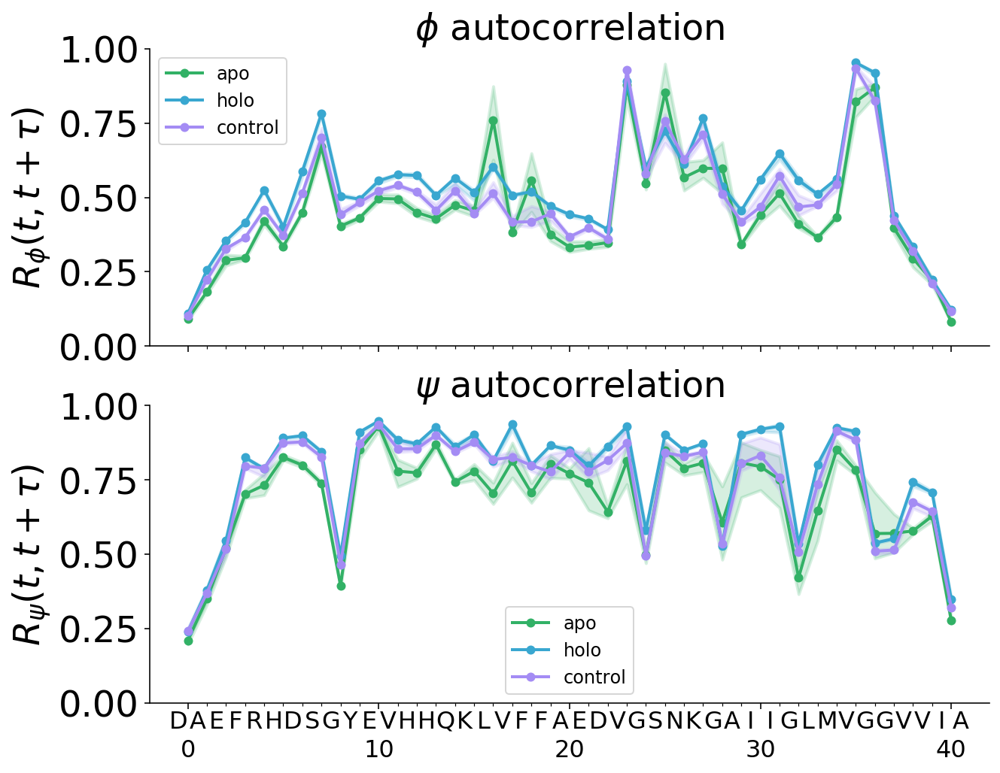

In [56]:
x = np.arange(nres - 1)
fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
for i in range(2):
    ax = axes[i]
    for j, k in enumerate(("apo", "holo", "control")):
        dhe = dih_corrs[k][:, i::2]
        dihent_m = dhe.mean(axis=0)
        dihent_l, dihent_h = np.percentile(dhe, q=(2.5, 97.5), axis=0)
        ax.plot(x, dihent_m, linewidth=2, color=colormap[k], label=k, marker="o", markersize=5)
        ax.fill_between(x, dihent_l, dihent_h, linewidth=2, color=colormap[k], alpha=0.2)
    sns.despine(ax=ax)
    ax.set_ylim(0, 1)
    ax.set_ylabel(r"$R_{{{0}}} (t, t + \tau)$".format(['\phi', '\psi'][i]), fontsize=24)
    ax.set_xticks(np.arange(0, nres, 10))
    ax.set_xticks(np.arange(nres - 1), minor=True)
    ax.tick_params(labelsize=24)
    ax.tick_params(axis="x", which="major", length=4, pad=20, labelsize=16)
    ax.tick_params(axis="x", which="minor", length=2, pad=0, labelsize=16)
    ax.set_title(r"${0}$ autocorrelation".format(['\phi', '\psi'][i]), fontsize=24)
    ax.legend(fontsize=12)

res = [r.code for i, r in enumerate(topo.residues)]
for i, r in enumerate(res):
    ax.text(i - 0.5, -0.085, r, fontsize=16, horizontalalignment="center")

plt.savefig("figs/autocorr-dih.pdf", transparent=True, bbox_inches="tight")
plt.savefig("figs/autocorr-dih.svg", transparent=True, bbox_inches="tight")

### Ramachandran entropy
We calculate the information entropy of each Ramachandran probability landscape:

In [58]:
n_bins = 100
rama_single = {}
for k in sim_names:
    inds = unflatten(np.arange(nframes[k]).reshape(-1, 1), lengths[k])
    rama_single[k] = {n: np.empty((attempts, nres - 1, n_bins, n_bins)) for n in outsizes}
    for i in range(attempts):
        generator = DataGenerator.from_state(inds, "models/model-idx-{0}-{1}.hdf5".format(k, i))
        idx = generator(n=2, lag=20).trains[0].flatten().astype(int)
        for n in outsizes:
            print("Processing k={0} n={1} i={2}...".format(k, n, i), end="\r")
            
            # We get the valid (not NaN) bagging state assignments
            w = weights[k][n][i, idx]
            valid = np.isfinite(w)
            
            # Raw backbone dihedrals are interlaced
            for j, (phi, psi) in enumerate(zip(dih[k].T[::2], dih[k].T[1::2])):
                hist, xe, ye = np.histogram2d(phi[idx][valid], psi[idx][valid], bins=n_bins,
                                              range=((-np.pi, np.pi), (-np.pi, np.pi)), weights=w[valid],
                                              density=True)
                rama_single[k][n][i, j] = hist

In [59]:
dihents_single = {}
for k in sim_names:
    dihents_single[k] = {}
    for n in outsizes:
        dihents_single[k][n] = -np.nansum(rama_single[k][n] * np.log2(rama_single[k][n]), axis=(-1, -2))

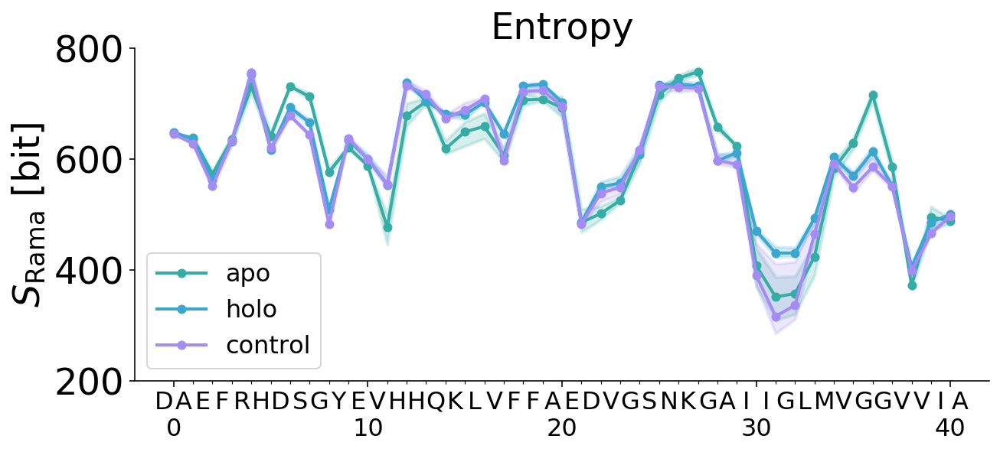

In [60]:
n = 2
x = np.arange(nres - 1)
fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot(111)
for j, k in enumerate(("apo", "holo", "control")):
    dhe = dihents_single[k][n]
    dihent_m = dhe.mean(axis=0)
    dihent_l, dihent_h = np.percentile(dhe, q=(2.5, 97.5), axis=0)
    ax.plot(x, dihent_m, linewidth=2, color=colors[j + 4], label=k, marker="o", markersize=5)
    ax.fill_between(x, dihent_l, dihent_h, linewidth=2, color=colors[j + 4], alpha=0.2)
sns.despine(ax=ax)
ax.set_ylim(200, 800)
ax.set_ylabel(r"$S_\mathrm{Rama}$ [bit]", fontsize=24)
ax.set_xticks(np.arange(0, nres, 10))
ax.set_xticks(np.arange(nres - 1), minor=True)
ax.tick_params(labelsize=24)
ax.tick_params(axis="x", which="major", length=4, pad=20, labelsize=16)
ax.tick_params(axis="x", which="minor", length=2, pad=0, labelsize=16)

res = [r.code for i, r in enumerate(topo.residues)]
for i, r in enumerate(res):
    ax.text(i - 0.5, 150, r, fontsize=16, horizontalalignment="center")

ax.set_title("Entropy", fontsize=24)
ax.legend(fontsize=16)
plt.savefig("figs/ents-dih-seq.pdf", transparent=True, bbox_inches="tight")
plt.savefig("figs/ents-dih-seq.svg", transparent=True, bbox_inches="tight")

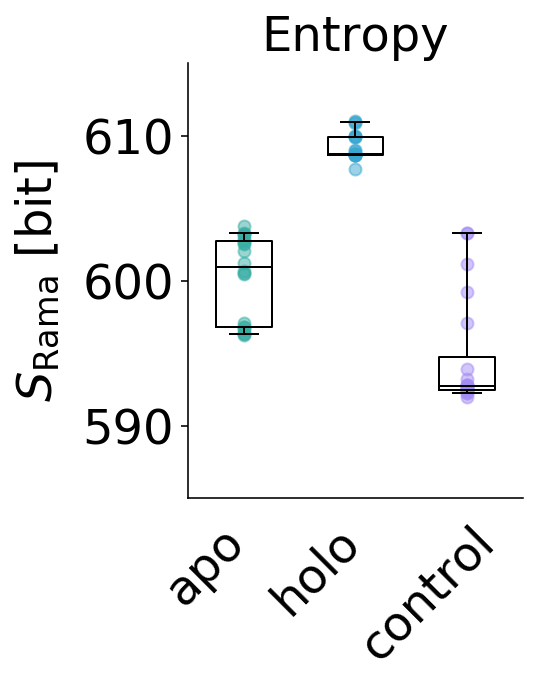

In [61]:
i, n = 0, 2
ents = {k: dihents_single[k][n].mean(axis=-1) for k in sim_names[:3]}
fig = plt.figure(figsize=(3, 4))
ax = fig.add_subplot(111)
for i, k in enumerate(sim_names[:3]):
    ax.plot(np.repeat([i + 1], attempts), ents[k], c=colors[i + 4], marker="o", linewidth=0, alpha=0.5)
    
bp = ax.boxplot(list(ents.values()), sym="", whis=[5, 95], meanline=False, widths=0.5,
                patch_artist=False, medianprops=dict(color="k"), showmeans=False,
                meanprops=dict(marker="o", markeredgecolor="k", markerfacecolor="white"))

ax.set_ylim(585, 615)
ax.set_xticks(np.arange(len(sim_names[:3])) + 0.65)
ax.set_xticklabels(sim_names, fontsize=24, rotation=45)
ax.set_ylabel(r"$S_\mathrm{Rama}$ [bit]", fontsize=24, labelpad=10)
ax.tick_params(labelsize=24)
ax.tick_params(axis="x", length=0, pad=10)
ax.set_title("Entropy", fontsize=24)
sns.despine(ax=ax)
plt.savefig("figs/ent-dih.pdf", bbox_inches="tight", transparent=True)
plt.savefig("figs/ent-dih.svg", bbox_inches="tight", transparent=True)

### State entropy
We evaluate the entropy within a state by it's ambiguity:

In [63]:
state_ents = {}
for k in sim_names:
    inds = unflatten(np.arange(nframes[k]).reshape(-1, 1), lengths[k])
    state_ents[k] = {n: np.empty((attempts)) for n in outsizes}
    for i in range(attempts):
        generator = DataGenerator.from_state(inds, "models/model-idx-{0}-{1}.hdf5".format(k, i))
        idx = generator(n=4, lag=20).trains[0].flatten().astype(int)
        for n in outsizes:
            print("Processing k={0} n={1} i={2}...".format(k, n, i), end="\r")
            
            # We get the valid (not NaN) bagging state assignments
            w = pfs[k][n][i, idx]
            pnorm = w[np.isfinite(w).all(axis=1)] / w[np.isfinite(w).all(axis=1)].sum(axis=0)
            state_ents[k][n][i] = -pis[k][n][i] @ np.nansum(pnorm * np.log2(pnorm), axis=0)

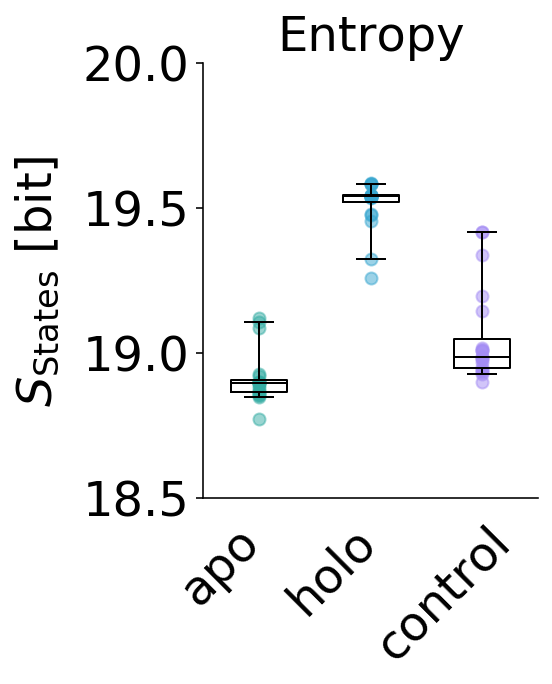

In [64]:
n = 2
ents = {k: state_ents[k][n] for k in sim_names[:3]}
fig = plt.figure(figsize=(3, 4))
ax = fig.add_subplot(111)
for i, k in enumerate(sim_names[:3]):
    ax.plot(np.repeat([i + 1], attempts), ents[k], c=colors[i + 4], marker="o", linewidth=0, alpha=0.5)
    
bp = ax.boxplot(list(ents.values()), sym="", whis=[5, 95], meanline=False, widths=0.5,
                patch_artist=False, medianprops=dict(color="k"), showmeans=False,
                meanprops=dict(marker="o", markeredgecolor="k", markerfacecolor="white"))

ax.set_ylim(18.5, 20.)
ax.set_xticks(np.arange(len(sim_names[:3])) + 0.65)
ax.set_xticklabels(sim_names[:3], fontsize=24, rotation=45)
ax.set_ylabel(r"$S_\mathrm{States}$ [bit]", fontsize=24, labelpad=10)
ax.tick_params(labelsize=24)
ax.tick_params(axis="x", length=0, pad=10)
ax.set_title("Entropy", fontsize=24)
sns.despine(ax=ax)
plt.savefig("figs/ent-state.pdf", bbox_inches="tight", transparent=True)
plt.savefig("figs/ent-state.svg", bbox_inches="tight", transparent=True)

## Kinetics
### Koopman operators
We can look at the Koopman operators and their errors directly:

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


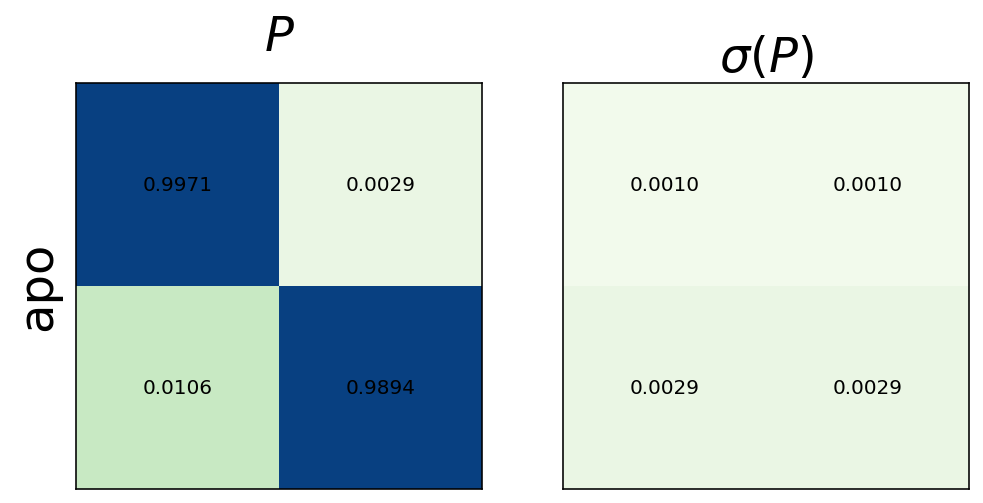

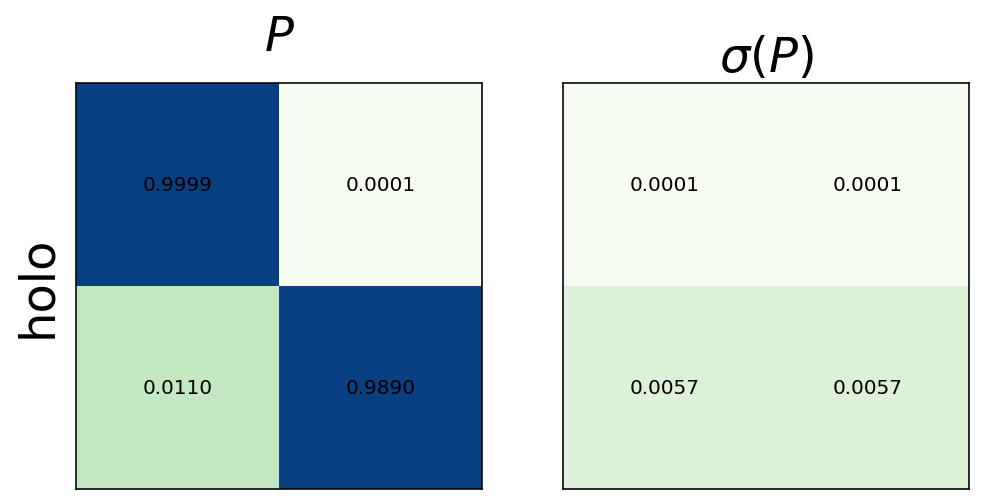

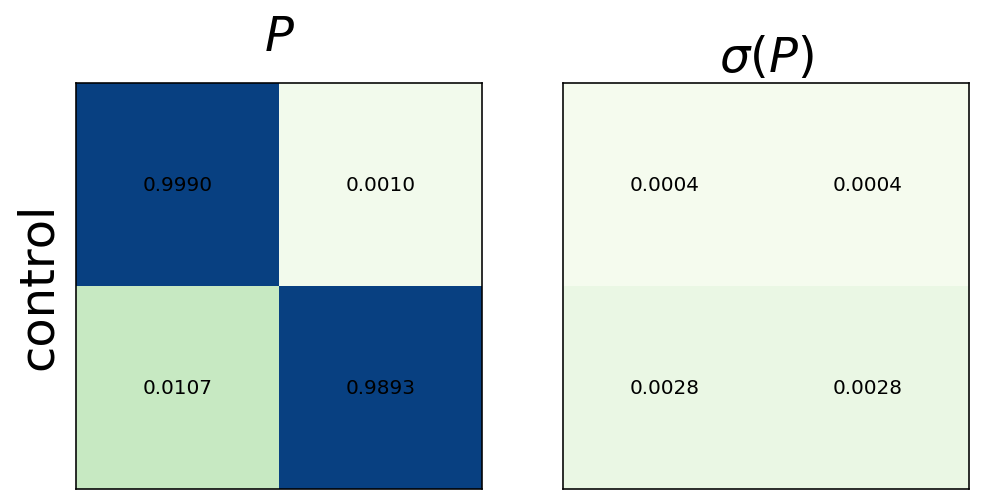

In [65]:
n = 2
for k in sim_names:
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    for ax, mat, title in zip(axes, (koops[k][n].mean(axis=0)[global_sorter[k][n]][:, global_sorter[k][n]],
                                     koops[k][n].std(axis=0)[global_sorter[k][n]][:, global_sorter[k][n]]),
                              ("$P$", r"$\sigma(P)$")):
        ax.matshow(mat, vmin=0.0, vmax=0.04, interpolation="nearest", cmap="GnBu")
        for i in range(n):
            for j in range(n):
                ax.text(j, i, "{0:2.4f}".format(mat[i, j]), ha="center", va="center", fontsize=10)
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_title(title, fontsize=24)
        ax.tick_params(length=0)
        if title == "$P$":
            ax.set_ylabel(k, fontsize=24)
        plt.savefig("figs/koop-{0}-{1}.pdf".format(k, n), bbox_inches="tight", transparent=True)
        plt.savefig("figs/koop-{0}-{1}.svg".format(k, n), bbox_inches="tight", transparent=True)

### Mean first passage times
We calculate mean first-passage times from our Koopman matrix $\mathbf{K}(\tau)$:

In [66]:
mfpts, rates = {}, {}
for k in sim_names:
    mfpts[k], rates[k] = {}, {}
    for n in outsizes:
        mfpts[k][n] = np.zeros((attempts, n, n))
        rates[k][n] = np.zeros((attempts, n, n))
        for i in range(attempts):
            koop = renormalize(koops[k][n][i], max_iter=1e5)
            print("Processing k={0} n={1} i={2}...".format(k, n, i), end="\r")
            for u in range(n):
                for v in range(n):
                    if u == v:
                        continue
                    f = tpt(koop, [u], [v])
                    rates[k][n][i, u, v] = f.rate
                    mfpts[k][n][i, u, v] = f.mfpt * 50 * dt * 0.001

In [67]:
n = 2
for k in sim_names[:3]:
    print(k)
    mfptm = mfpts[k][n].mean(axis=0)[global_sorter[k][n]][:, global_sorter[k][n]]
    mfpte = mfpts[k][n].std(axis=0)[global_sorter[k][n]][:, global_sorter[k][n]]
    for i in range(n):
        for j in range(n):
            if i == j:
                continue
            print(fr"{i} -> {j}  {mfptm[i, j]:4.2f} ± {mfpte[i, j]:4.2f} µs")

apo
0 -> 1  4.93 ± 2.25 µs
1 -> 0  1.29 ± 0.40 µs
holo
0 -> 1  205.50 ± 185.62 µs
1 -> 0  1.58 ± 1.19 µs
control
0 -> 1  15.04 ± 10.13 µs
1 -> 0  1.24 ± 0.31 µs


In [68]:
n = 2
for k in sim_names[:3]:
    print(k)
    tmprate = 1e6 * rates[k][n] / (50 * dt)
    ratem = tmprate.mean(axis=0)
    ratee = tmprate.std(axis=0)
    for i in range(n):
        for j in range(n):
            if i == j:
                continue
            print(fr"{i} -> {j}  {ratem[i, j]:4.2f} ± {ratee[i, j]:4.2f} 1 / ms")

apo
0 -> 1  234.09 ± 76.67 1 / ms
1 -> 0  846.41 ± 230.99 1 / ms
holo
0 -> 1  10.86 ± 11.51 1 / ms
1 -> 0  877.36 ± 453.78 1 / ms
control
0 -> 1  858.73 ± 223.27 1 / ms
1 -> 0  83.74 ± 28.68 1 / ms


We use this to get arrow thicknesses:

In [69]:
allrates = np.stack([1e6 * rates[k][n] / (50 * dt) for k in sim_names[:3]])
allrates = (allrates - allrates.min()) / allrates.ptp()
(allrates * (3.5 - 1.0) + 1.0).mean(axis=1)

array([[[1.        , 1.30361918],
        [2.09779126, 1.        ]],

       [[1.        , 1.01408346],
        [2.13793247, 1.        ]],

       [[1.        , 2.11377049],
        [1.10860714, 1.        ]]])

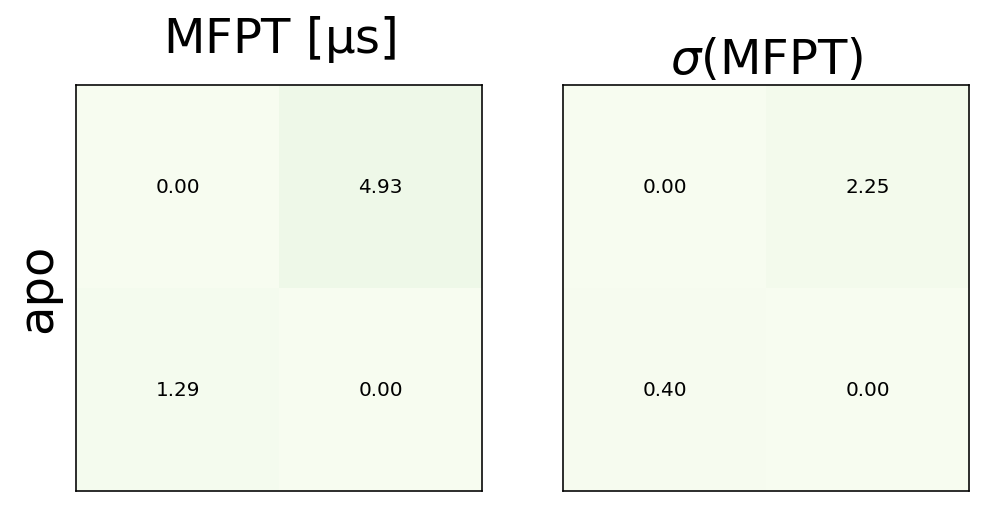

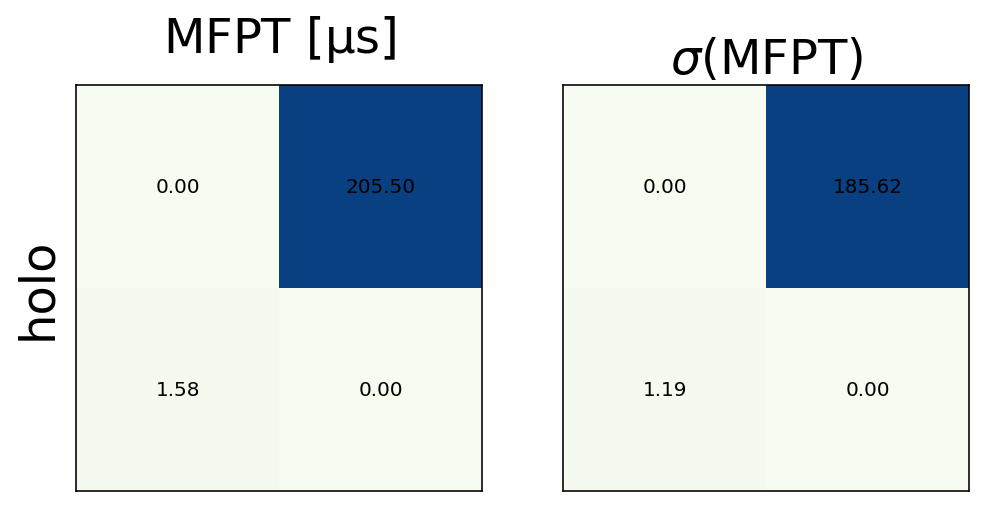

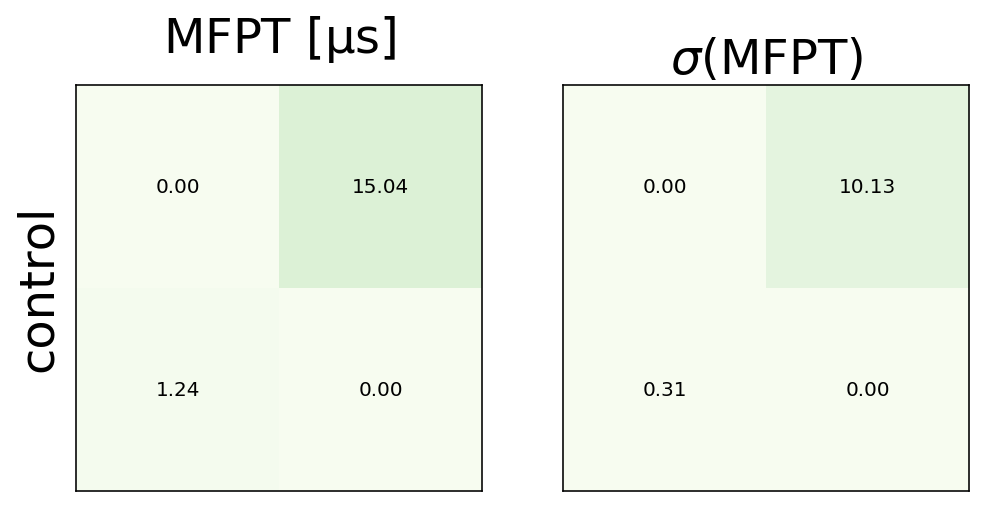

In [70]:
n = 2
for k in sim_names:
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    for ax, mat, title in zip(axes, (mfpts[k][n].mean(axis=0)[global_sorter[k][n]][:, global_sorter[k][n]],
                                     mfpts[k][n].std(axis=0)[global_sorter[k][n]][:, global_sorter[k][n]]),
                              (r"$\mathrm{MFPT}$ [µs]", r"$\sigma(\mathrm{MFPT})$")):
        ax.matshow(mat, vmin=0.0, vmax=100, interpolation="nearest", cmap="GnBu")
        for i in range(n):
            for j in range(n):
                ax.text(j, i, "{0:2.2f}".format(mat[i, j]), ha="center", va="center", fontsize=10)
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_title(title, fontsize=24)
        ax.tick_params(length=0)
        if title == r"$\mathrm{MFPT}$ [µs]":
            ax.set_ylabel(k, fontsize=24)
        plt.savefig("figs/mfpt-{0}-{1}.pdf".format(k, n), bbox_inches="tight", transparent=True)
        plt.savefig("figs/mfpt-{0}-{1}.svg".format(k, n), bbox_inches="tight", transparent=True)

### Lifetimes
The lifetimes are dependent on the probability of transition into the same state, they are given by:

$$ \overline{t}_i = \frac{-\tau}{\log K_{ii}} $$

where $K_{ii}$ are the diagonal elements of the transition matrix and $\tau$ is the model lagtime.

In [71]:
t_max = 1000
lifetimes = {}
for k in sim_names:
    lifetimes[k] = {}
    for n in outsizes:
        lt = np.empty((attempts, n))
        for i in range(attempts):
            lt[i] = -lag * dt / np.log(np.diag(koops[k][n][i])) * 1e-3
        lt[lt > t_max] = np.nan
        lt[lt < 0] = np.nan
        lifetimes[k][n] = lt[:, global_sorter[k][n]]

In [72]:
n = 2
for k in sim_names[:3]:
    print(k)
    ltm = lifetimes[k][n].mean(axis=0)
    lts = lifetimes[k][n].std(axis=0)
    for i in range(n):
        print(fr"State {i}  {ltm[i]:4.2f} ± {lts[i]:4.2f} µs")

apo
State 0  1.97 ± 0.90 µs
State 1  0.51 ± 0.16 µs
holo
State 0  86.49 ± 87.21 µs
State 1  0.63 ± 0.48 µs
control
State 0  6.00 ± 4.04 µs
State 1  0.49 ± 0.12 µs


### Equilibrium distribution
We can look at the equilibrium distributions $\mathbf{\pi}$:

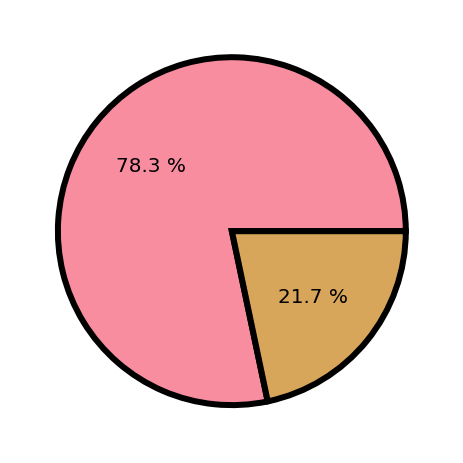

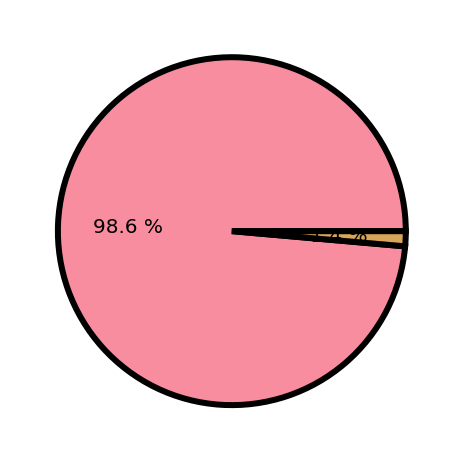

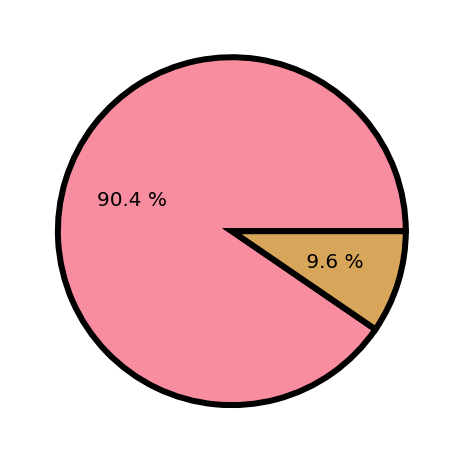

In [73]:
n = 2
pm = {k: pis[k][n][:, global_sorter[k][n]] for k in sim_names}
for k in sim_names:
    fig = plt.figure(figsize=(4, 4))
    ax = fig.add_subplot(111)
    ax.pie(pm[k].mean(axis=0), colors=[(*c, 0.8) for c in colors],
           autopct=lambda p: f"{p:4.1f} %",
           wedgeprops=dict(linewidth=3, edgecolor="k"))
    plt.savefig("figs/pop-pie-{0}-{1}.pdf".format(k, n), bbox_inches="tight", transparent=True)
    plt.savefig("figs/pop-pie-{0}-{1}.svg".format(k, n), bbox_inches="tight", transparent=True)

## Small molecule
### Residue interactions
We calculate the minimum distance between the small molecule and all residues:

In [75]:
mindist_res = {}
for k in ("holo", "control"):
    filename = f"intermediate/mindist-res-{k}.npy"
    if os.path.exists(filename):
        mindist_res[k] = np.load(filename)
    else:
        pairs = list(itertools.product([42], range(nres)))
        feat = pe.coordinates.featurizer(top[k])
        feat.add_residue_mindist(residue_pairs=pairs, ignore_nonprotein=False)
        inp = pe.coordinates.source(trajs[k], feat)
        mindist_res[k] = np.vstack(inp.get_output())
        np.save(filename, mindist_res[k])

### Small molecule - protein contact lifetimes
We calculate the lifetime of contacts formed between the small molecule and the peptide on a residue level.

In [76]:
cutoff = 0.45
n_samples = 20
lts = {}
for k in ("holo", "control"):
    moldist_all = mindist_res[k] < cutoff
    con_trajs = unflatten(moldist_all, lengths=lengths[k])
    lts[k] = np.empty((n_samples, nres))
    for s in range(n_samples):
        print(f"Processing k={k} s={s}/{n_samples}", end="\r")
        sample_inds = np.random.randint(0, len(con_trajs), len(con_trajs))
        for j in range(nres):
            cond = [np.ascontiguousarray(con_trajs[ind].astype(int)[:, j]) for ind in sample_inds]
            msm = pe.msm.estimate_markov_model(cond, lag=20)
            lts[k][s, j] = (-lag * dt / np.log(np.diag(msm.P)))[1]

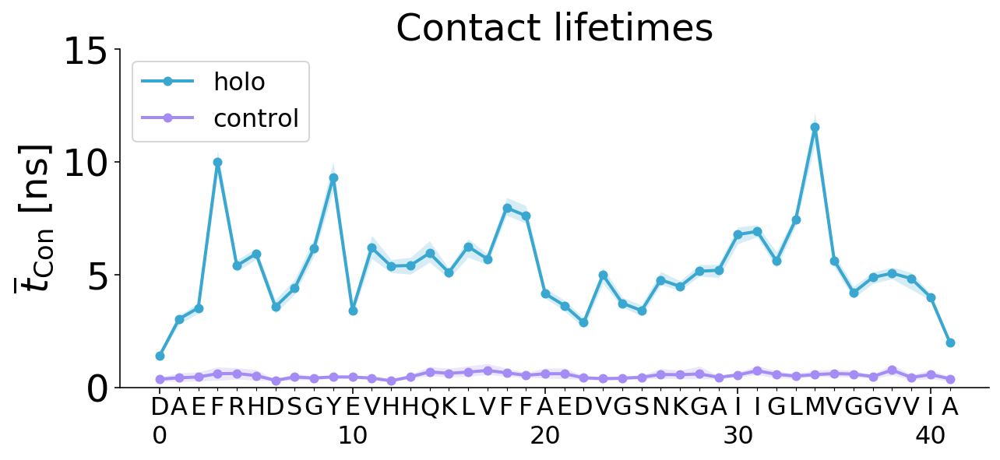

In [77]:
x = np.arange(nres)
fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot(111)
for j, k in enumerate(("holo", "control")):
    con_ltm = np.nanmean(lts[k] * dt, axis=0)
    con_ltl, con_lth = np.percentile(lts[k] * dt, q=(2.5, 97.5), axis=0)
    ax.plot(x, con_ltm, linewidth=2, color=colors[j + 5], label=k, marker="o", markersize=5)
    ax.fill_between(x, con_ltl, con_lth, linewidth=0, color=colors[j + 5], alpha=0.2)
sns.despine(ax=ax)
ax.set_ylim(0, 15)
ax.set_ylabel(r"$\overline{t}_\mathrm{Con}$ [ns]", fontsize=24)
ax.set_xticks(np.arange(0, nres, 10))
ax.set_xticks(np.arange(nres), minor=True)
ax.tick_params(labelsize=24)
ax.tick_params(axis="x", which="major", length=4, pad=20, labelsize=16)
ax.tick_params(axis="x", which="minor", length=2, pad=0, labelsize=16)

res = [r.code for i, r in enumerate(topo.residues)]
for i, r in enumerate(res):
    ax.text(i, -0.08 * ax.get_ylim()[1], r, fontsize=16, horizontalalignment="center")

ax.set_title("Contact lifetimes", fontsize=24)
ax.legend(fontsize=16, ncol=1)
plt.savefig(f"figs/con-lt-seq-{cutoff}.pdf", transparent=True, bbox_inches="tight")
plt.savefig(f"figs/con-lt-seq-{cutoff}.svg", transparent=True, bbox_inches="tight")

### Small molecule - protein contacts
We calculate the contacts formed between the small molecule and the peptide on a residue level.

In [79]:
cutoff = 0.45
cons_all = {}
for k in ("holo", "control"):
    mindist_con = mindist_res[k] < cutoff
    inds = unflatten(np.arange(nframes[k]).reshape(-1, 1), lengths[k])
    cons_all[k] = np.empty((attempts, nres))
    for i in range(attempts):
        generator = DataGenerator.from_state(inds, "models/model-idx-{0}-{1}.hdf5".format(k, i))
        idx = generator(n=n, lag=20).trains[0].flatten().astype(int)
        print("Processing k={0} i={1}...".format(k, i), end="\r")
        w = weights[k][n][i, idx]
        valid = np.isfinite(w)
        cons_all[k][i] = np.einsum("i,ij->j", w[valid], mindist_con[idx][valid]) / w[valid].sum()

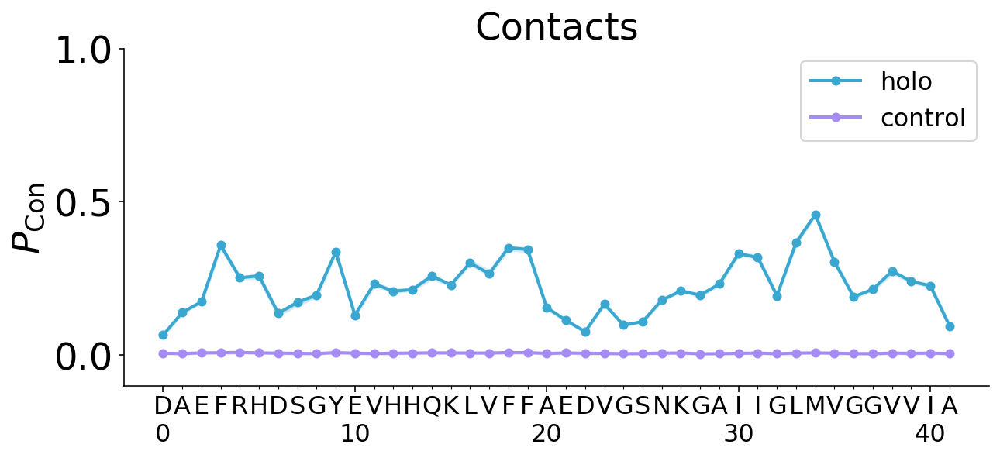

In [80]:
x = np.arange(nres)
fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot(111)
for j, k in enumerate(("holo", "control")):
    conm = np.nanmean(cons_all[k], axis=0)
    conl, conh = np.percentile(cons_all[k], q=(2.5, 97.5), axis=0)
    ax.plot(x, conm, linewidth=2, color=colors[j + 5], label=k, marker="o", markersize=5)
    ax.fill_between(x, conl, conh, linewidth=2, color=colors[j + 5], alpha=0.2)
sns.despine(ax=ax)
ax.set_ylim(-0.1, 1.0)
ax.set_ylabel(r"$P_\mathrm{Con}$", fontsize=24)
ax.set_xticks(np.arange(0, nres, 10))
ax.set_xticks(np.arange(nres), minor=True)
ax.tick_params(labelsize=24)
ax.tick_params(axis="x", which="major", length=4, pad=20, labelsize=16)
ax.tick_params(axis="x", which="minor", length=2, pad=0, labelsize=16)

res = [r.code for i, r in enumerate(topo.residues)]
for i, r in enumerate(res):
    ax.text(i, -0.19 * ax.get_ylim()[1], r, fontsize=16, horizontalalignment="center")

ax.set_title("Contacts", fontsize=24)
ax.legend(fontsize=16, ncol=1);
plt.savefig(f"figs/con-seq-{cutoff}.pdf", transparent=True, bbox_inches="tight")
plt.savefig(f"figs/con-seq-{cutoff}.svg", transparent=True, bbox_inches="tight")

### Pi stacking
We evaluate whether transient $\pi$-stacking between aromatic residues and the small molecule shows any preferential orientation. If yes, we would see a varying balance in all four quadrants of the $\alpha$-$\beta$ plot.

In [81]:
def make_stacking_angles(sub_atoms, lig_atoms):
    def stacking_angles(xtc):
        coms = np.empty((xtc.n_frames, 2, 3))
        normals = np.empty((xtc.n_frames, 2, 3))
        for i, atoms in enumerate((sub_atoms, lig_atoms)):
            # Center-of-mass for each aromatic system
            coms[:, i] = md.compute_center_of_mass(xtc.atom_slice(atoms))

            # Create a and b vectors in the aromatic plane to compute the normals
            com_o_r = np.empty((xtc.n_frames, 2, 3))
            for j in range(2):
                other = xtc.atom_slice(atoms).xyz[:, j]
                com_o_r[:, j] = other - coms[:, i]
                com_o_r[:, j] /= np.linalg.norm(com_o_r[:, j], axis=1, keepdims=True)
            normals[:, i] = (np.cross(com_o_r[:, 0], com_o_r[:, 1]) /
                             np.sqrt(1 - com_o_r.prod(axis=1).sum(axis=-1) ** 2).reshape(-1, 1))

        # Distance between both aromatic COMs
        com_r = np.diff(coms, axis=1)

        # alpha (substrate aromatic angle to COM-distance) and
        # beta (ligand aromatic angle to COM-distance)
        angles = np.arccos((com_r * normals).sum(axis=-1) /
                         (np.linalg.norm(com_r, axis=-1) *
                          np.linalg.norm(normals, axis=-1)))
        
        # COM distances
        comds = np.sqrt((com_r.squeeze() ** 2).sum(axis=-1)).reshape(-1, 1)

        return np.hstack((angles.astype(np.float32), comds.astype(np.float32)))
    return stacking_angles

In [84]:
n_atoms = {k: md.load_topology(top[k]).n_atoms for k in sim_names}

# Benzofurazan (G5) motifs
lig_arom_atoms = dict(
    holo=dict(
        nbf=np.array([1, 2, 3, 4, 5, 6, 7, 11, 12]) + n_atoms["apo"],  # Nitrobenzofurazan
        a1=np.array([13, 14, 15, 16, 17, 18]) + n_atoms["apo"],  # Center phenyl
        a2=np.array([19, 20, 21, 22, 23, 24]) + n_atoms["apo"],  # Ortho phenyl
    ),
)

resids = (3, 9, 18, 19) # PHE4, TYR10, PHE19, PHE20

k = "holo"
angles = {}
for arom_res in resids:
    angles[arom_res] = {}
    res_name = topo.residue(arom_res)
    sub_arom_atoms = topo.select(f"resid {arom_res} and (name CG or name CD1 or name CD2 or name CE1 or name CE2 or name CZ)")
    for name, frag in lig_arom_atoms[k].items():

        filename = f"intermediate/stacking-{name}-{res_name}-{k}.npy"
        if os.path.exists(filename):
            angles[arom_res][name] = np.load(filename)
        else:
            stacking = make_stacking_angles(sub_arom_atoms, frag)
            feat = pe.coordinates.featurizer(top[k])
            feat.add_custom_func(stacking, dim=3)
            inp = pe.coordinates.source(trajs[k], feat)
            angles[arom_res][name] = np.vstack(inp.get_output())
            np.save(filename, angles[arom_res][name])

In [85]:
k = "holo"
n_bins = 50
mats = {}
for resid in angles.keys():
    mats[resid] = {}
    for arom_res in angles[resid].keys():
        print("Processing res={0} arom={1}...".format(resid, arom_res), end="\r")
        ang = angles[resid][arom_res]
        inter = ang[:, 2] < 0.6
        hist, xe, ye = np.histogram2d(*(ang[inter, :2].T), bins=n_bins,
                                      range=((0, np.pi), (0, np.pi)), density=True)
        xe, ye = 0.5 * (xe[:-1] + xe[1:]), 0.5 * (ye[:-1] + ye[1:])
        X, Y = np.meshgrid(xe, ye)
        mats[resid][arom_res] = hist

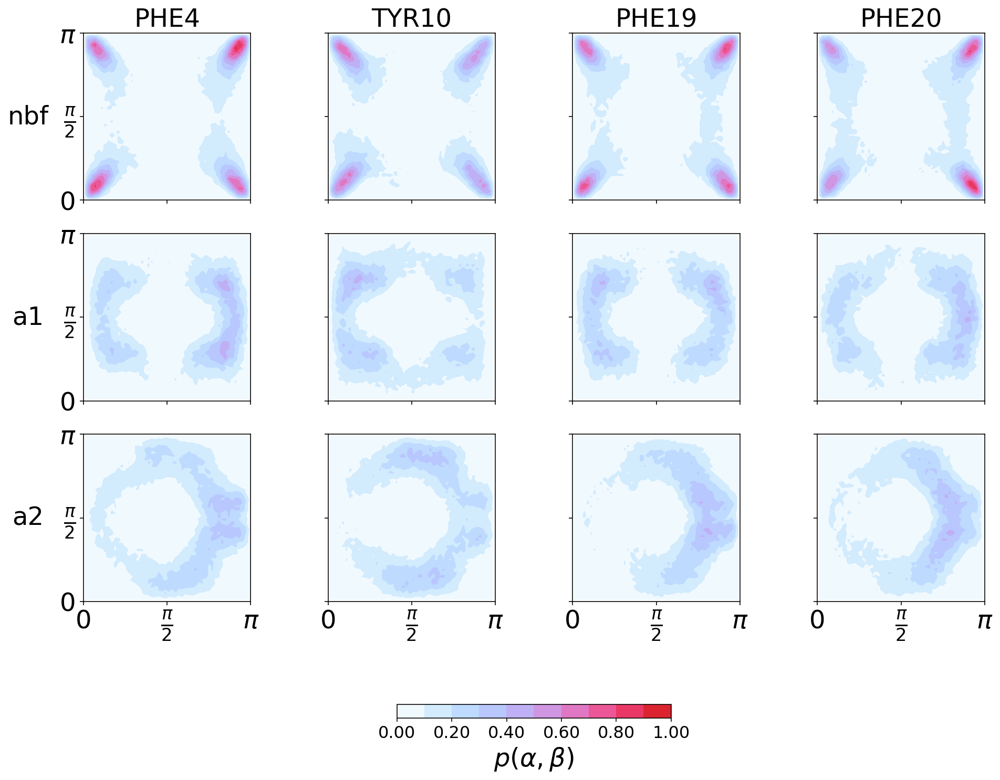

In [86]:
k = "holo"
nx, ny = len(mats), len(mats[3])
fig, axes = plt.subplots(ny, nx, figsize=(4 * nx, 4 * ny), sharex=True, sharey=True)
for i, resid in enumerate(mats.keys()):
    for j, arom_res in enumerate(mats[resid].keys()):
        ax = axes[j, i]
        F = mats[resid][arom_res]
        im = ax.contourf(X, Y, F, np.arange(0, 1.1, 0.1), vmin=0.0, vmax=1.0, cmap=cc.m_CET_L19)
    #     ax.contour(X, Y, F, np.arange(0, 2, 0.2), vmin=0.0, vmax=2.0, cmap=cc.m_CET_L19, linewidth=10)
        ax.set(adjustable="box", aspect="equal")
        ax.tick_params(labelsize=24)
        if j == 0:
            ax.set_title(topo.residue(resid), fontsize=24)
        if i == 0:
            ax.set_ylabel(arom_res, fontsize=24, rotation=0, labelpad=30, va="center", ha="center")
        ax.set_xlim(0, np.pi)
        ax.set_ylim(0, np.pi)
        ax.set_xticks([0, np.pi / 2, np.pi])
        ax.set_xticklabels([r"0", r"$\frac{\pi}{2}$", r"$\pi$"], fontsize=24)
        ax.set_yticks([0, np.pi / 2, np.pi])
        ax.set_yticklabels([r"0", r"$\frac{\pi}{2}$", r"$\pi$"], fontsize=24)

cb = fig.colorbar(im, ax=axes.ravel().tolist(), orientation="horizontal", fraction=0.02)
cb.set_ticks(np.arange(0.0, 1.2, 0.2))
cb.set_ticklabels([f"{t:4.2f}" for t in np.arange(0.0, 1.2, 0.2)])
cb.ax.set_xlabel(r"$p(\alpha, \beta)$", fontsize=24)
cb.ax.tick_params(labelsize=16)
plt.savefig("figs/pi-stack-{0}.pdf".format(k), transparent=True, bbox_inches="tight")
plt.savefig("figs/pi-stack-{0}.svg".format(k), transparent=True, bbox_inches="tight")

#### Conditional $\pi$-stacking
If we're stacking with residue $i$, what is the probability of simultaneously stacking with $j$?

In [87]:
k = "holo"
n_pi_res = len(resids)
n_pi_lig = len(lig_arom_atoms[k])
pist = np.empty((n_pi_res, n_pi_lig, nframes[k], 3))
for i, resid in enumerate(angles.keys()):
    for j, arom_res in enumerate(angles[resid].keys()):
        pist[i, j] = angles[resid][arom_res]

In [88]:
inds = unflatten(np.arange(nframes[k]).reshape(-1, 1), lengths[k])
cond_pi = np.empty((attempts, n_pi_lig, n_pi_res, n_pi_res))
for a in range(attempts):
    generator = DataGenerator.from_state(inds, "models/model-idx-{0}-{1}.hdf5".format(k, a))
    idx = generator(n=n, lag=20).trains[0].flatten().astype(int)
    print("Processing k={0} i={1}...".format(k, a), end="\r")
    w = weights[k][n][a, idx]
    valid = np.isfinite(w)
    stack = (pist[:, :, :, 2] < 0.6)[:, :, idx][:, :, valid]
    for s in range(n_pi_lig):
        for i in range(n_pi_res):
            for j in range(n_pi_res):
                pij = (w[valid] * (stack[i, s] & stack[j, s])).sum() / w[valid].sum()
                pj = (w[valid] * stack[j, s]).sum() / w[valid].sum()
                cond_pi[a, s, i, j] = pij / pj

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


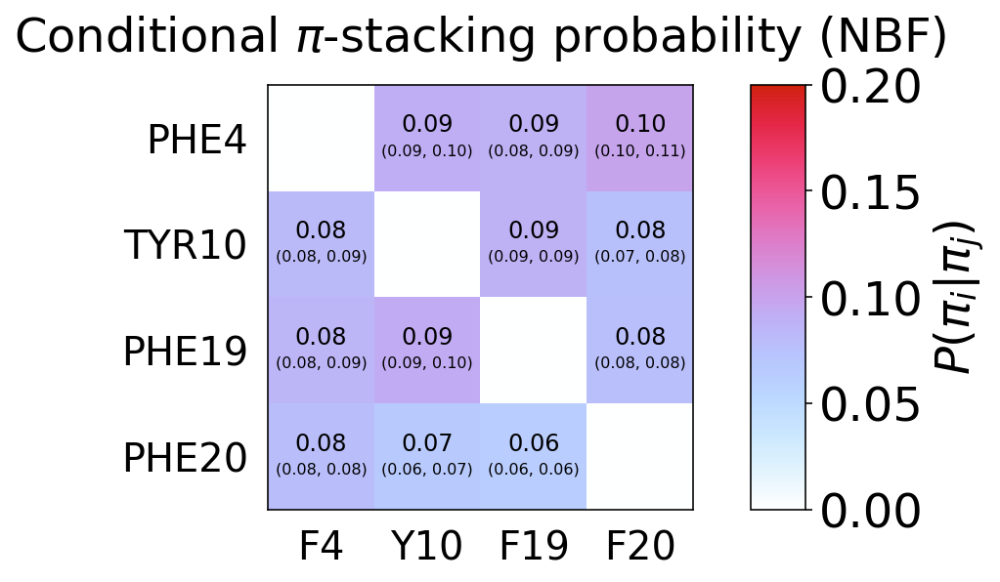

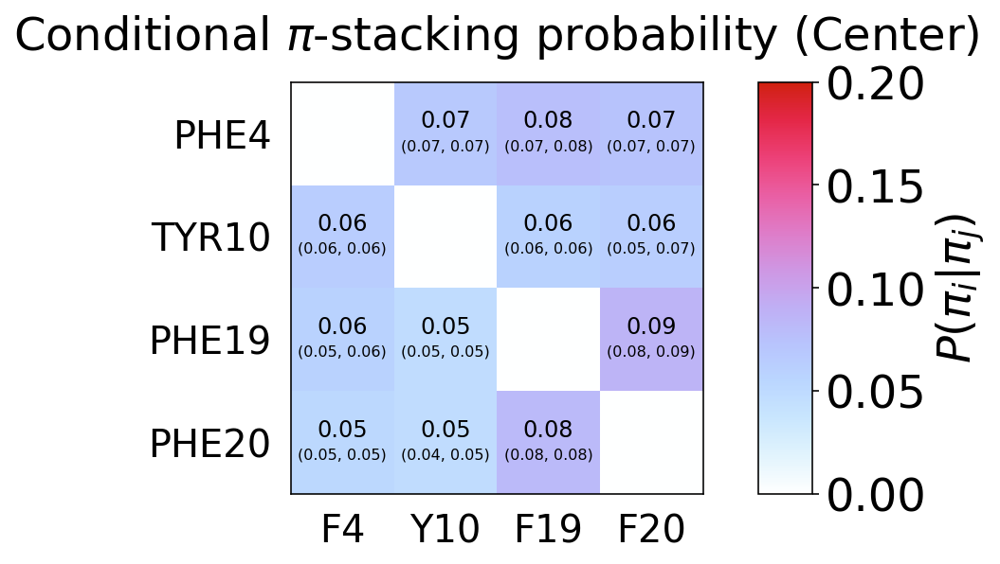

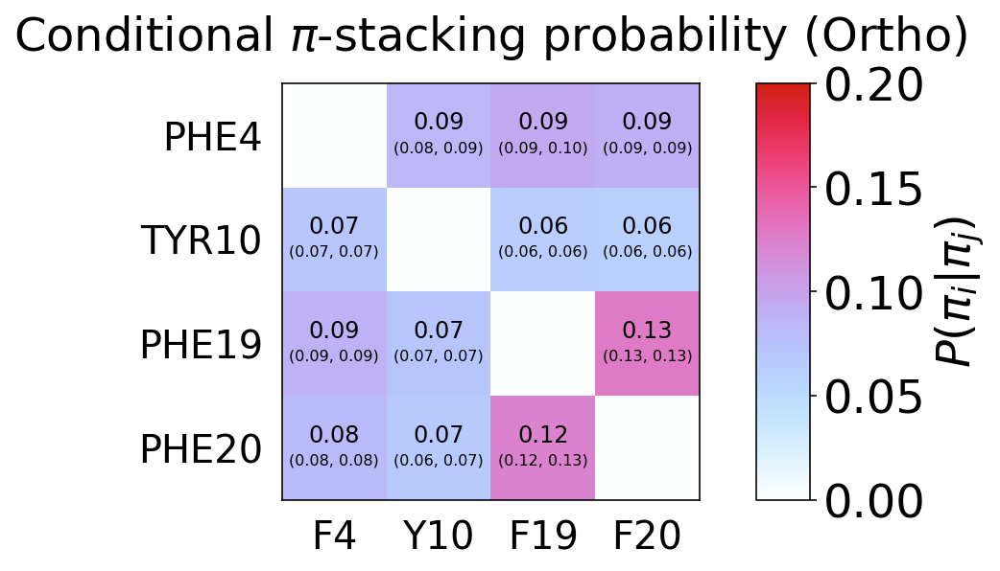

In [89]:
mol_pi_labels = ["NBF", "Center", "Ortho"]
for s in range(n_pi_lig):
    fig, axes = plt.subplots(1, 1 + 1, figsize=(1 * 4 + 1, 4),
                             sharex=False, sharey=False, gridspec_kw={"width_ratios": [8] * 1 + [1]})
    n = cond_pi.shape[-1]
    ax = axes[0]
    mat = cond_pi[:, s].mean(axis=0) * ~np.eye(n, dtype=bool)
    ml, mh = np.percentile(cond_pi[:, s] * ~np.eye(n, dtype=bool), q=(2.5, 97.5), axis=0)
    cmap = sns.light_palette(colors[i + 4], as_cmap=True)
    im = ax.matshow(mat, vmin=0.0, vmax=0.2, interpolation="nearest", cmap=cc.m_CET_L19)
    for u in range(n):
        for v in range(n):
            if u == v:
                continue
            ax.text(v, u - 0.12, "{0:2.2f}".format(mat[u, v]), ha="center", va="center", fontsize=12)
            ax.text(v, u + 0.12, "({0:2.2f}, {1:2.2f})".format(ml[u, v], mh[u, v]),
                    ha="center", va="center", fontsize=8)
    ax.xaxis.tick_bottom()
    ax.set_xticks(np.arange(0, n, 1))
    ax.set_yticks(np.arange(0, n, 1))
    ax.set_xticklabels([f"{topo.residue(r).code}{topo.residue(r).index + 1}" for r in resids], fontsize=20)
    ax.set_yticklabels([topo.residue(r) for r in resids], fontsize=20)
    ax.tick_params(labelsize=20, length=0, pad=10)
    ax.set_title(fr"Conditional $\pi$-stacking probability ({mol_pi_labels[s]})", fontsize=24)

    cax = axes[-1]
    fig.colorbar(im, cax=cax, orientation="vertical")
    cax.yaxis.set_ticks(np.arange(0, 0.25, 0.05))
    cax.set_yticklabels(f"{t:4.2f}" for t in np.arange(0, 0.25, 0.05))
    cax.set_ylabel(r"$P(\pi_i | \pi_j)$", fontsize=24)
    cax.tick_params(labelsize=24)
    plt.savefig("figs/cond-pi-stack-{0}.pdf".format(s), transparent=True, bbox_inches="tight")
    plt.savefig("figs/cond-pi-stack-{0}.svg".format(s), transparent=True, bbox_inches="tight")

### Small molecule interactions
We look at interactions on a per-atom level for the small molecule to identify areas with favourable interactions:

In [90]:
smiles = dict(
    holo="O=[N+](C1=CC=C(NC2=C(C3=CC=CC=C3)C=CC=C2)C4=NON=C41)[O-]",
    control="C(=O)(N)N",
)

atom_map = dict(
    # Atom index remapping, see below 
    holo=np.array([6, 5, 19, 20, 21, 22, 23, 2, 1, 24, 0, 3, 4,
                   7, 18, 17, 16, 15, 8, 9, 10, 11, 12, 13, 14,
                   27, 25, 26, 36, 35, 34, 33, 28, 29, 30, 31, 32]),
    control=np.arange(8),
)

n_atoms_mol = {k: n_atoms[k] - n_atoms["apo"] for k in ("holo", "control")}

Minimum distances from each atom of the small molecule to any residue:

In [91]:
mindist_mol = {}
for k in ("holo", "control"):
    filename = f"intermediate/mindist-mol-{k}.npy"
    if os.path.exists(filename):
        mindist_mol[k] = np.load(filename)
    else:
        group_def = [np.arange(n_atoms["apo"])] + [[i] for i in range(n_atoms["apo"], n_atoms[k])]
        group_pairs = np.array(list(itertools.product([0], range(1, n_atoms[k] - n_atoms["apo"] + 1))))
        feat = pe.coordinates.featurizer(top[k])
        feat.add_group_mindist(group_definitions=group_def, group_pairs=group_pairs)
        inp = pe.coordinates.source(trajs[k], feat)
        mindist_mol[k] = np.vstack(inp.get_output())
        np.save(filename, mindist_mol[k])

#### Numbering correction
The RDKit and PDB numbering are not compatible so we show the small molecules with numbering in order to find the correct mapping. No need to execute this more than once, the final mapping can be found above.

In [92]:
def mol_with_atom_index(mol):
    """Show the atom index with the RDkit molecule"""
    for atom in mol.GetAtoms():
        atom.SetAtomMapNum(atom.GetIdx())
    return mol

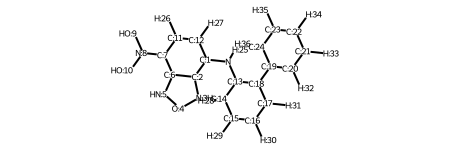

In [93]:
# Verifying atom numbering
k = "holo"
with TemporaryDirectory() as tmp:
    xtc = md.load_xtc(trajs[k][0], top=top[k])
    topo = md.load_topology(top[k])
    xtc.atom_slice(topo.select("residue 43"))[0].save_pdb(f"{tmp}/lig.pdb")
    mol_pdb = Chem.MolFromPDBFile(f"{tmp}/lig.pdb", sanitize=False)
    mol_pdb.Compute2DCoords()
mol_with_atom_index(mol_pdb)

#### Small molecule - protein contacts
We run through several different cutoffs to find the one where the differences become most apparent:

In [97]:
cutoff = 0.3
n = 2
moldist = {}
for k in ("holo", "control"):
    inds = unflatten(np.arange(nframes[k]).reshape(-1, 1), lengths[k])
    moldist[k] = np.empty((attempts, n_atoms_mol[k]))
    for i in range(attempts):
        generator = DataGenerator.from_state(inds, "models/model-idx-{0}-{1}.hdf5".format(k, i))
        idx = generator(n=n, lag=20).trains[0].flatten().astype(int)
        print("Processing k={0} i={1}...".format(k, i), end="\r")
        w = weights[k][n][i, idx]
        valid = np.isfinite(w)
        moldist[k][i] = w[valid] @ (mindist_mol[k][idx][valid] < cutoff) / w[valid].sum()

We need to patch this `rdkit` function to get proper colormap behaviour:

In [95]:
from rdkit import Geometry
from rdkit.Chem import Draw, rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D
import math

def GetSimilarityMapFromWeights(mol, weights, colorMap=None, vmin=None, vmax=None, size=(250, 250),
                                sigma=None, coordScale=1.5, step=0.01, colors='k', contourLines=10,
                                alpha=0.5, draw2d=None, **kwargs):
    """
    Generates the similarity map for a molecule given the atomic weights.

    Parameters:
      mol -- the molecule of interest
      colorMap -- the matplotlib color map scheme, default is custom PiWG color map
      scale -- the scaling: scale < 0 -> the absolute maximum weight is used as maximum scale
                            scale = double -> this is the maximum scale
      size -- the size of the figure
      sigma -- the sigma for the Gaussians
      coordScale -- scaling factor for the coordinates
      step -- the step for calcAtomGaussian
      colors -- color of the contour lines
      contourLines -- if integer number N: N contour lines are drawn
                      if list(numbers): contour lines at these numbers are drawn
      alpha -- the alpha blending value for the contour lines
      kwargs -- additional arguments for drawing
    """
    if mol.GetNumAtoms() < 2:
        raise ValueError("too few atoms")
    if draw2d is not None:
        mol = rdMolDraw2D.PrepareMolForDrawing(mol,addChiralHs=False)
        if not mol.GetNumConformers():
            rdDepictor.Compute2DCoords(mol)
        if sigma is None:
            if mol.GetNumBonds() > 0:
                bond = mol.GetBondWithIdx(0)
                idx1 = bond.GetBeginAtomIdx()
                idx2 = bond.GetEndAtomIdx()
                sigma = 0.3 * (mol.GetConformer().GetAtomPosition(idx1)-mol.GetConformer().GetAtomPosition(idx2)).Length()
            else:
                sigma = 0.3 * (mol.GetConformer().GetAtomPosition(0)-mol.GetConformer().GetAtomPosition(1)).Length()
            sigma = round(sigma, 2)
        sigmas = [sigma]*mol.GetNumAtoms()
        locs=[]
        for i in range(mol.GetNumAtoms()):
            p = mol.GetConformer().GetAtomPosition(i)
            locs.append(Geometry.Point2D(p.x,p.y))
        draw2d.ClearDrawing()
        ps = Draw.ContourParams()
        ps.fillGrid=True
        ps.gridResolution=0.1
        ps.extraGridPadding = 0.5
        Draw.ContourAndDrawGaussians(draw2d,locs,weights,sigmas,nContours=contourLines,params=ps)
        draw2d.drawOptions().clearBackground = False
        draw2d.DrawMolecule(mol)
        return draw2d

    fig = Draw.MolToMPL(mol, coordScale=coordScale, size=size, **kwargs)
    if sigma is None:
        if mol.GetNumBonds() > 0:
            bond = mol.GetBondWithIdx(0)
            idx1 = bond.GetBeginAtomIdx()
            idx2 = bond.GetEndAtomIdx()
            sigma = 0.3 * math.sqrt(
              sum([(mol._atomPs[idx1][i] - mol._atomPs[idx2][i])**2 for i in range(2)]))
        else:
            sigma = 0.3 * \
                math.sqrt(sum([(mol._atomPs[0][i] - mol._atomPs[1][i])**2 for i in range(2)]))
        sigma = round(sigma, 2)
    x, y, z = Draw.calcAtomGaussians(mol, sigma, weights=weights, step=step)
    # rescale based on weights
    if vmin is None:
        vmin = np.min(weights)
    if vmax is None:
        vmax = np.max(weights)
    z = np.interp(z, (z.min(), z.max()), (0, np.max(weights)))
    
    # coloring
    if colorMap is None:
        if cm is None:
            raise RuntimeError("matplotlib failed to import")
        PiYG_cmap = cm.get_cmap('PiYG', 2)
        colorMap = LinearSegmentedColormap.from_list(
            'PiWG', [PiYG_cmap(0), (1.0, 1.0, 1.0), PiYG_cmap(1)], N=255)

    im = fig.axes[0].imshow(z, cmap=colorMap, interpolation='bilinear', origin='lower',
                       extent=(0, 1, 0, 1), vmin=vmin, vmax=vmax)
    # contour lines
    # only draw them when at least one weight is not zero
    if len([w for w in weights if w != 0.0]):
        contourset = fig.axes[0].contour(
            x, y, z, contourLines, colors=colors, alpha=alpha, **kwargs)
        for j, c in enumerate(contourset.collections):
            if contourset.levels[j] == 0.0:
                c.set_linewidth(0.0)
            elif contourset.levels[j] < 0:
                c.set_dashes([(0, (3.0, 3.0))])
    fig.axes[0].set_axis_off()
    return fig, im

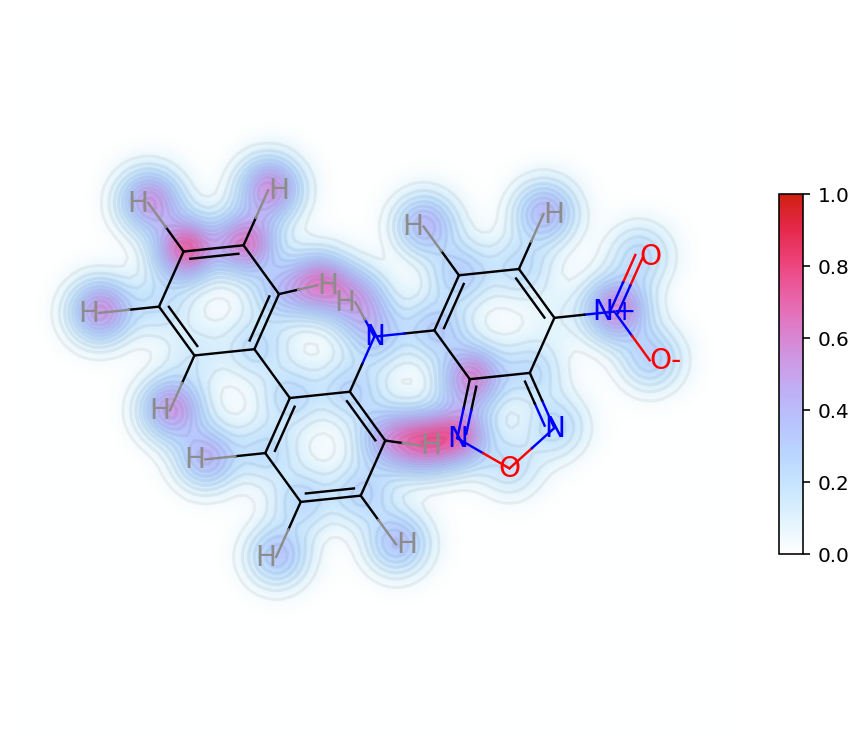

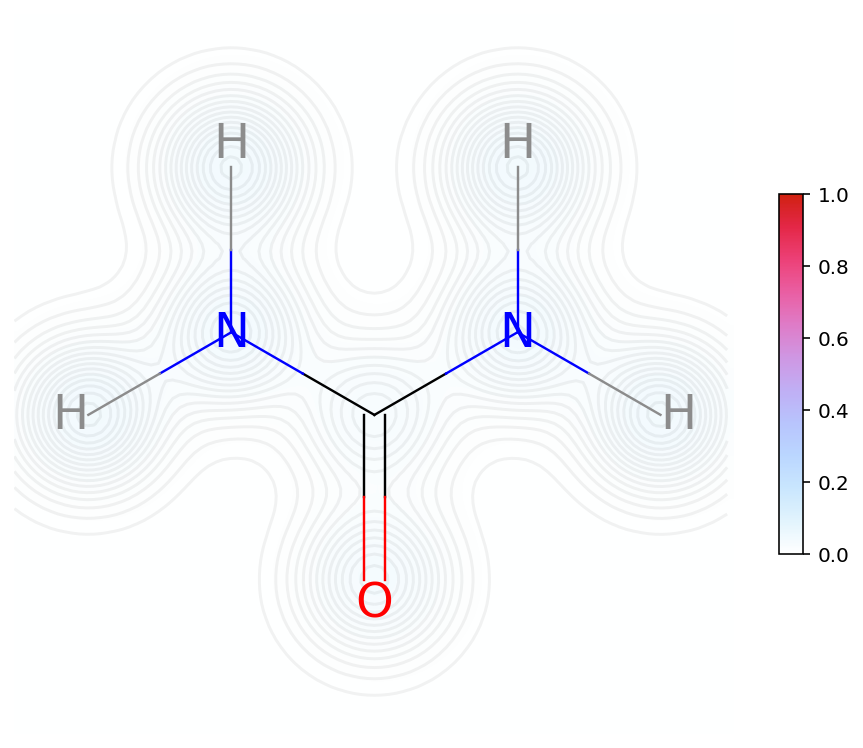

In [98]:
for i, k in enumerate(("holo", "control")):
    cmap = LinearSegmentedColormap.from_list("map", [(1, 1, 1), colors[i + 5]], N=256)
    mol = Chem.AddHs(Chem.MolFromSmiles(smiles[k]))
    mol.Compute2DCoords()
    fig, im = GetSimilarityMapFromWeights(
            mol, moldist[k].mean(axis=0)[atom_map[k]], vmin=0.0, vmax=1.0, step=0.01,
        contourLines=16, alpha=0.05, colorMap=cc.m_CET_L19)
    fig.colorbar(im, shrink=0.4, aspect=15)
    plt.savefig("figs/mol-inter-{0}.pdf".format(k), transparent=True, bbox_inches="tight")
    plt.savefig("figs/mol-inter-{0}.svg".format(k), transparent=True, bbox_inches="tight")

#### Small molecule contact lifetimes
We look at the average lifetimes of small molecule - protein contacts for all small molecule atoms:

In [99]:
cutoff = 0.45
n_samples = 20
lts_mol = {}
for k in ("holo", "control"):
    moldist_all = mindist_mol[k] < cutoff
    con_trajs = unflatten(moldist_all, lengths=lengths[k])
    lts_mol[k] = np.empty((n_samples, n_atoms_mol[k]))
    for s in range(n_samples):
        print(f"Processing k={k} s={s}/{n_samples}", end="\r")
        sample_inds = np.random.randint(0, len(con_trajs), len(con_trajs))
        for j in range(n_atoms_mol[k]):
            cond = [np.ascontiguousarray(con_trajs[ind].astype(int)[:, j]) for ind in sample_inds]
            msm = pe.msm.estimate_markov_model(cond, lag=20)
            lts_mol[k][s, j] = (-lag * dt / np.log(np.diag(msm.P)))[1]

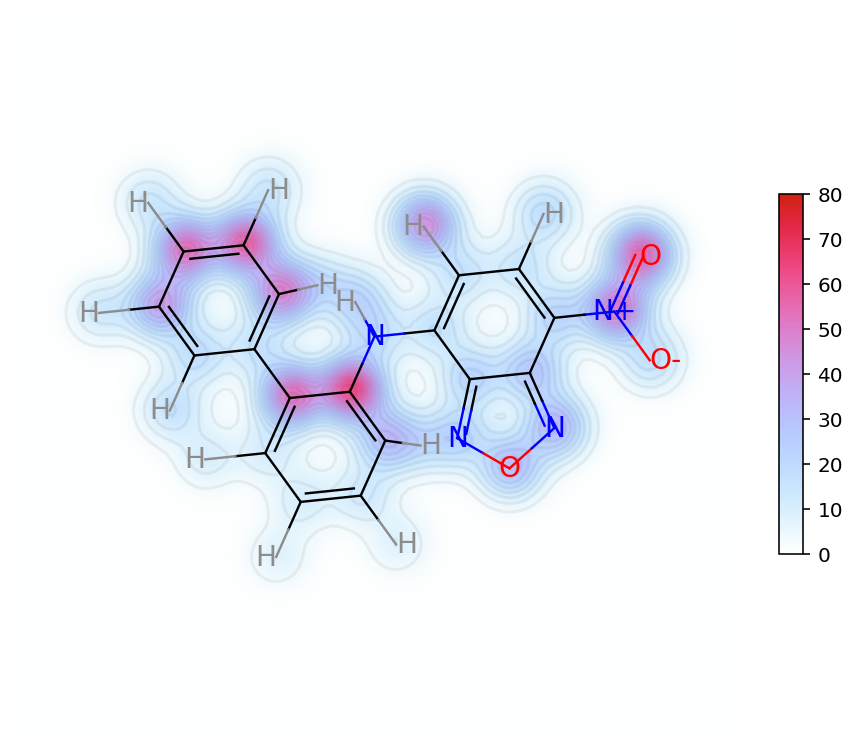

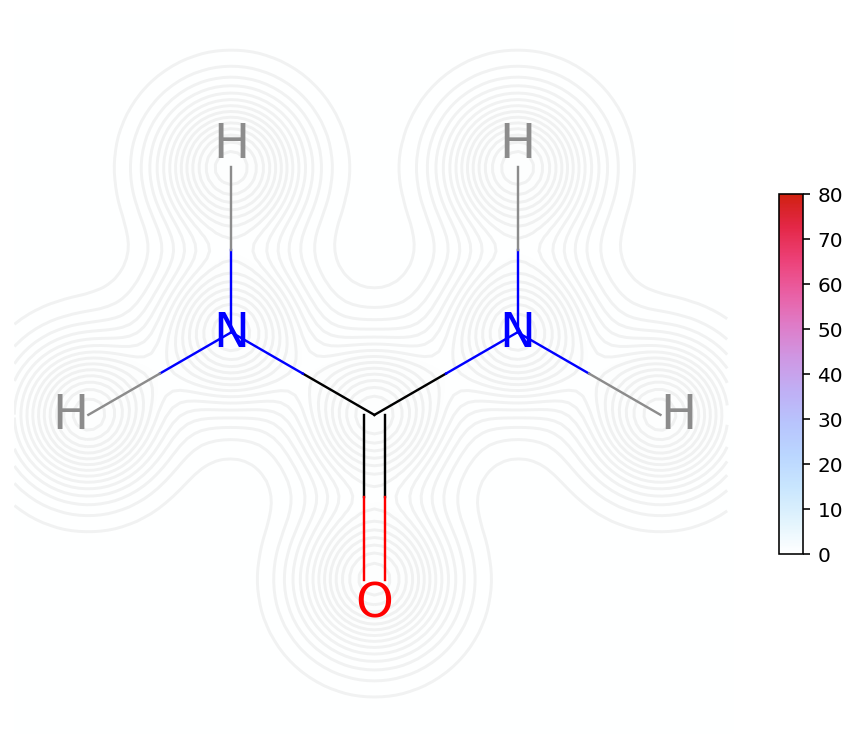

In [100]:
for i, k in enumerate(("holo", "control")):
    cmap = LinearSegmentedColormap.from_list("map", [(1, 1, 1), colors[i + 5]], N=256)
    mol = Chem.AddHs(Chem.MolFromSmiles(smiles[k]))
    mol.Compute2DCoords()
    fig, im = GetSimilarityMapFromWeights(
            mol, lts_mol[k].mean(axis=0)[atom_map[k]] * dt, vmin=0.0, vmax=80.0, step=0.01,
        contourLines=16, alpha=0.05, colorMap=cc.m_CET_L19)
    fig.colorbar(im, shrink=0.4, aspect=15)
    plt.savefig("figs/mol-lt-msm-{0}.pdf".format(k), transparent=True, bbox_inches="tight")
    plt.savefig("figs/mol-lt-msm-{0}.svg".format(k), transparent=True, bbox_inches="tight")

### Transitions
We look for trajectories with full state transitions with some simple heuristics. This can be cool for visualisation with VMD, Chimera, etc...

In [48]:
n = 4
upf = unflatten(pfs[n].mean(axis=0)[:, global_sorter[n]], lengths=lengths)
window, frac, minn = 10, 0.8, 5
transitions = defaultdict(list)
for i, t in enumerate(upf):
    instate = (t[:window].max(axis=1) > frac).sum() > minn and (t[-window:].max(axis=1) > frac).sum() > minn
    samestate = t[0].argmax() == t[-1].argmax()
    if instate and not samestate:
        transitions[(t[0].argmax(), t[-1].argmax())].append(i)

Example use:

In [176]:
idx_to_traj(transitions[(0, 1)][0], lengths=[1024, 1023, 1024, 1024, 1024])

(3, 913)

### Example structures
We extract representative structures for each state, for example just the ones with highest weight:

In [105]:
for k in sim_names:
    flatlengths = np.array(list(itertools.chain(*lengths[k])))
    for n in outsizes:
        spfs = pfs[k][n].mean(axis=0)[:, global_sorter[k][n]]
        sids = spfs.argsort(axis=0)[-50:]
        for s in range(n):
            trjind = []
            for ind in sids[:, s]:
                pdiff = flatlengths.cumsum() - ind
                trjidx = np.where(pdiff > 0)[0][0]
                trjnr = pdiff[trjidx]
                trjind.append((trjidx, trjnr - 1))

            frames = md.join(md.load_frame(trajs[k][trjidx], trjnr, top=top[k])
                             for i, (trjidx, trjnr) in enumerate(trjind))
            frames.save_pdb("structures/state-{0}-{1}-{2}-top.pdb".format(k, n, s))
            np.savetxt("structures/state-{0}-{1}-{2}-top-p.dat".format(k, n, s), spfs[:, s][sids[:, s]])

or by sampling randomly based on these weights:

In [106]:
for k in sim_names:
    nsamples = 50
    flatlengths = np.array(list(itertools.chain(*lengths[k])))
    allinds = np.arange(nframes[k], dtype=np.int64)
    for n in outsizes:
        spfs = pfs[k][n].mean(axis=0)[:, global_sorter[k][n]]
        valid = np.isfinite(spfs).all(axis=1)
        for s in range(n):
            p = spfs[:, s][valid] / spfs[:, s][valid].sum()
            sids = np.random.choice(allinds[valid], size=nsamples, replace=False, p=p)
            trjind = []
            for ind in sids:
                pdiff = flatlengths.cumsum() - ind
                trjidx = np.where(pdiff > 0)[0][0]
                trjnr = pdiff[trjidx]
                trjind.append((trjidx, trjnr - 1))

            frames = md.join(md.load_frame(trajs[k][trjidx], trjnr, top=top[k])
                             for i, (trjidx, trjnr) in enumerate(trjind))
            frames.save_pdb("structures-alt/state-{0}-{1}-{2}-top.pdb".format(k, n, s))
            np.savetxt("structures-alt/state-{0}-{1}-{2}-top-p.dat".format(k, n, s), spfs[:, s][sids])